<a href="https://colab.research.google.com/github/vdakov/AOC_2022/blob/main/crown_delineation_segment_anything_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Crown Delineation with Segment-Anything
This notebook is meant to outline my attempts at crown delineation using Meta's Segment Anything Model and any pre- and post- processing done alongside it. As of the moment of writing the annotated data used here is from the NEON dataset used by DeepForest.

Crown delineation is the estimation of a tree crown's area along with the localization of its centroid.

Meta's Segment Anything is an object detection model that attempts to create masks of all of the objects in the image. Here it is used in the context of vegetation detection in Sofia, Bulgaria. More specifically, this is to demonstrate the part of the pipeline after localization of the individual trees. As such (for the majority of this notebook at least), perfect tree localization is assumed.

### Setup
The code blocks prepare any dependencies, setting and global variables used throughout the entire notebook. The dependencies are accordingly:
- `roboflow`: a commonly used computer vision framework mostly for object detection and classification models. It has a lot of useful prebuilt CV functionality
- `supervision`: an extended CV tool implementing specifically Segment-Anything and YOLO. This notebook utilizes a large part of its prebuilt funcitonality integrated with sam. It is integrated with Roboflow which is why they are downloaded together.

In [1]:
!pip install Pillow==8.2.0
!pip install -q roboflow supervision
# If there is a prompt to restart the notebook, please do, otherwise some cells might not run correctly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 MB 21.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for Pillow: filename=Pillow-8.2.0-cp310-cp310-linux_x86_64.whl size=1159040 sha256=5ce426d456f89ad96a083c6e1a2473f7e2ddf72125026012edd6844ba9e6a935
  Stored in directory: /root/.cache/pip/wheels/70/8a/2c/7f8208f565545ea014c5644ed58e3dece5a462b98fe8d6d148
Successfully built Pillow
  Attempting uninstall: Pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.5 requires pillow>=8.3.2, but you have pillow 8.2.0 which is incompatible.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 103.0 MB/s eta 0:00:00


Please execute the code block below to allow GPU acceleration and the image segmentation in reasonable time.

In [2]:
!nvidia-smi

Thu Oct 12 16:05:24 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
from google.colab import drive
drive.mount('/content/drive')

!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
drive  sample_data


Please execute the code block below as to define some relative paths, download the SAM model for the current session, as well as the path towards the dataset to be used for the crown delineation. If any errors are given here, please setup the paths correctly.

*For people browsing from GATE Institute, I have uploaded the all data I have used in this notebook on Microsoft Teams. Please upload the files from the 'data'and 'ground-truth' folders respectively. *


In [2]:
import os
import sys

HOME = os.getcwd()
print("HOME:", HOME)
%cd {HOME}

!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'



!mkdir {HOME}/crown-delineation-data
!mkdir {HOME}/crown-delineation-data/data
!mkdir {HOME}/crown-delineation-data/data/ground-truth

IMAGE_FOLDER_PATH = HOME + '/crown-delineation-data/data'
print(IMAGE_FOLDER_PATH, "; exist:", os.path.isdir(IMAGE_FOLDER_PATH))

HOME: /content
/content
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-dc6d5jyz
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-dc6d5jyz
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36586 sha256=7d95afcae9994133968fbbef6bd70fd7db63e47d3f615954b52644139895c1d8
  Stored in directory: /tmp/pip-ephem-wheel-cache-qk6u5cow/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
/content/crown-delineation-data/data ; exist: True


For SAM to work properly, it needs a device from Torch. For optimum speed, we will use NVIDIA's CUDA.

In [3]:
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(DEVICE)
MODEL_TYPE = "vit_h"

cuda:0


## Dataset Discussion

Here I give a short overview of what data I used for the recognition of the trees here. I have used a mixture of open datasets from previous vegetation classfication attempts and a subset of the lozenets training data we have. The data comes in the form of a bounding box around a tree.

In other words, all images processed here are assumed to be perfectly localized trees. There is a tree in the image found by a localization model/pipeline.

### Open-Source Datasets

The NEON (National Ecological Observatory Network - https://data.neonscience.org/) is a U.S. organization that collects all sorts of ecological data, including various forest datasets. In particular, we are using 20 images from their BONA dataset from 2019. It is of particular interest to us as DeepForest, a vegetation localization model from the same period already has provided bounding boxes for this and many other forests. Down the line, picking trees from different forest types could aid in the creation of a more adjustible recognition pipeline.

It is worth noting, however, that this data is fundamentally different from the one in Sofia, as the setting is an actual forest, not an urban center like Sofia.

Below is an example for illustration puproses.


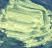

### Sofia Samples

The research in the context of Sofia is concerned with the localization and recognition of trees in an urban envirnoment. All data used from Sofia is from the Lozenets district of the city. It is considered representative of a majority of vegetation scenarios in the city: there are trees in proximity to buildings, in clusters in parks, on the side of the street, etc. A region of 20 512 x 512 10cm tiles have been hand-annotated by researchers at GATE institute for training purposes. A subset of those hand-annotated bounding boxes is left here.

Below is an example for illustation purposes.

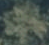

## Working with SAM
The below cells show a sample iteration of working with SAM. It is here that will be mentioned a large part of the considerations that need to be taken into account when working with the model. It is a general foundation model used primarily for image segmentation.

**Things to keep in mind when working with it are:**"
- The model can be prompted with text, bounding boxes and points. All of them are equally valid prompts
- The model will always try to output multiple masks for the same prompt. It is its way to deal with ambiguity. There need to be according post-processing methods created to handle these multiple masks. They can be processed by heuristics such as IoU score, area, etc. The default is 3.
- The model has not been trained on a specific type of object. The dataset contains 11 million images of a general nature. As such it *should not* be biased towards any specific object. The images it has been trained on have been of a high resolution (e.g. 3000 x 4500).

*All of the above information has been explicitly stated either in SAM's API (or any of the dependencies that use SAM) or Meta's official paper on the model*


In [4]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

%cd {HOME}
print(os.getcwd())
print(os.listdir(os.getcwd()))
CHECKPOINT_PATH='sam_vit_h_4b8939.pth'
print(CHECKPOINT_PATH, "; exist:", os.path.exists(CHECKPOINT_PATH))
sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE) #the variable containing the model we will be using with the actual SAM model

/content
/content
['.config', 'sam_vit_h_4b8939.pth', 'drive', 'crown-delineation-data', 'sample_data']
sam_vit_h_4b8939.pth ; exist: True


In [5]:
mask_generator = SamAutomaticMaskGenerator(sam) #the default SAM class, which samples multiple single-point prompts in a grid so SAM can predict multiple masks

In [7]:
import cv2
import supervision as sv

%cd {HOME}
%cd {IMAGE_FOLDER_PATH}

print(IMAGE_FOLDER_PATH)
# SAMPLE_IMAGE_PATH = [f for f in os.listdir('.') if os.path.isfile(f)][0]
SAMPLE_IMAGE_PATH = os.path.join(IMAGE_FOLDER_PATH, '2019_BONA_3_468000_7222000_image_-125_8120_-79_8174_bbox.png')


sample_image_bgr = cv2.imread(SAMPLE_IMAGE_PATH)
sample_image_rgb = cv2.cvtColor(sample_image_bgr, cv2.COLOR_BGR2RGB)

sample_image_rgb = cv2.GaussianBlur(sample_image_rgb, (5,5),cv2.BORDER_DEFAULT)
sample_image_rgb = cv2.medianBlur(sample_image_rgb, 5)


# scale_percent = 300 # percent of original size
# width = int(sample_image_rgb.shape[1] * scale_percent / 100)
# height = int(sample_image_rgb.shape[0] * scale_percent / 100)
# dim = (width, height)

# resize image
# sample_image_rgb = cv2.resize(sample_image_rgb, dim, interpolation = cv2.INTER_CUBIC )

sample_sam_result = mask_generator.generate(sample_image_rgb)
print(sample_image_rgb)

/content
/content/crown-delineation-data/data
/content/crown-delineation-data/data
[[[ 76 113 128]
  [ 77 114 130]
  [ 79 116 131]
  ...
  [130 147 156]
  [113 132 144]
  [112 129 144]]

 [[ 77 114 130]
  [ 78 115 131]
  [ 80 117 132]
  ...
  [130 147 156]
  [124 138 153]
  [113 132 144]]

 [[ 79 115 131]
  [ 79 116 131]
  [ 81 118 132]
  ...
  [137 151 164]
  [130 147 156]
  [124 138 153]]

 ...

 [[ 84 125 128]
  [ 84 125 128]
  [ 87 128 130]
  ...
  [181 205 166]
  [178 203 165]
  [172 197 164]]

 [[ 84 125 128]
  [ 85 126 128]
  [ 87 129 131]
  ...
  [178 203 166]
  [169 195 164]
  [169 195 162]]

 [[ 84 125 128]
  [ 85 126 129]
  [ 88 129 131]
  ...
  [169 195 164]
  [169 195 162]
  [169 194 160]]]


(46, 54, 3) (138, 162, 3)


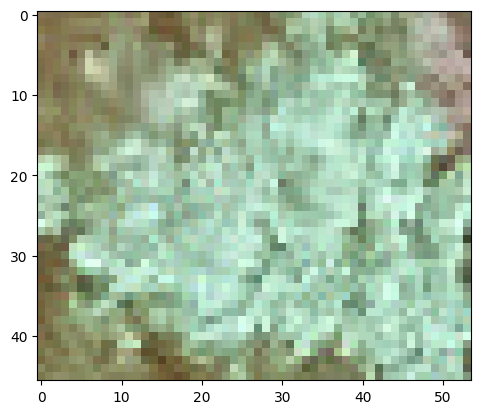

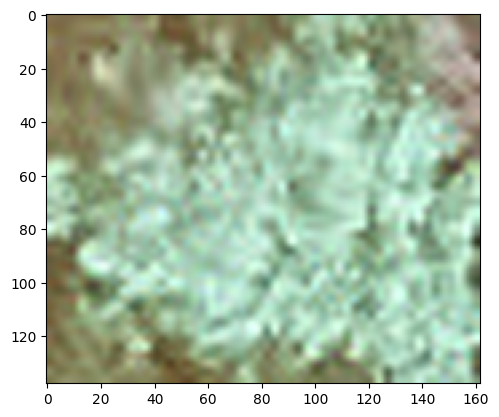

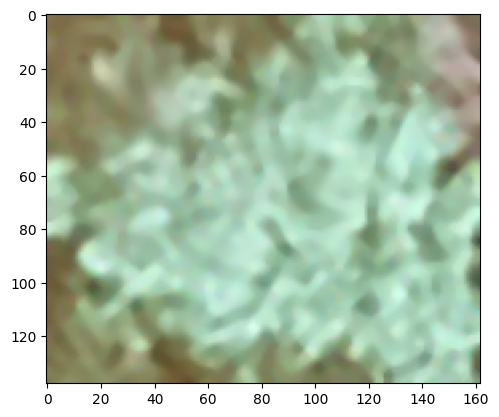

In [8]:
import matplotlib.pyplot as plt

img_resize_before = cv2.imread(SAMPLE_IMAGE_PATH)
new_width, new_height = img_resize_before.shape[0] * 3, img_resize_before.shape[1] * 3
img_resize = cv2.resize(img_resize_before, (new_height, new_width), interpolation=cv2.INTER_CUBIC)
img_resize_median = cv2.medianBlur(img_resize, 5)

print(img_resize_before.shape, img_resize.shape)

plt.imshow(img_resize_before)
plt.show()
plt.imshow(img_resize)
plt.show()
plt.imshow(img_resize_median)
plt.show()

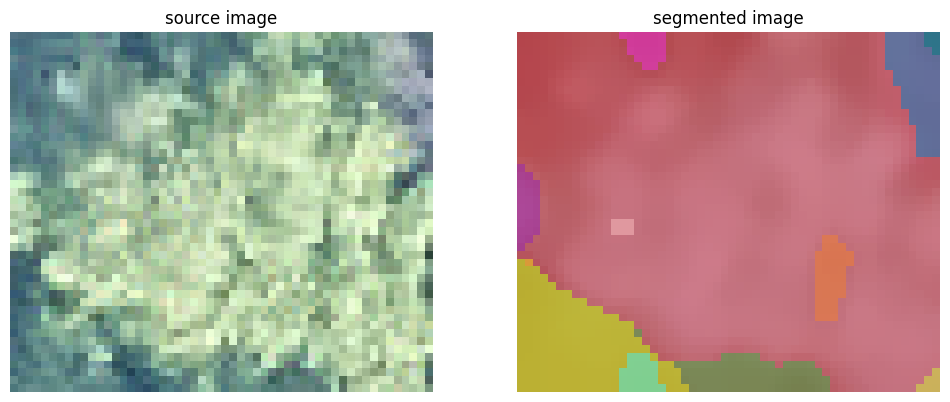

In [9]:
mask_annotator = sv.MaskAnnotator(color_map='index')

detections = sv.Detections.from_sam(sam_result=sample_sam_result) #outputs the decected masks into the Detections class from supervision (https://roboflow.github.io/supervision/quickstart/detections/)

annotated_image = mask_annotator.annotate(scene=sample_image_rgb, detections=detections) # to display the actual masks, SAM needs to overlay them on the original image

sv.plot_images_grid(
    images=[sample_image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

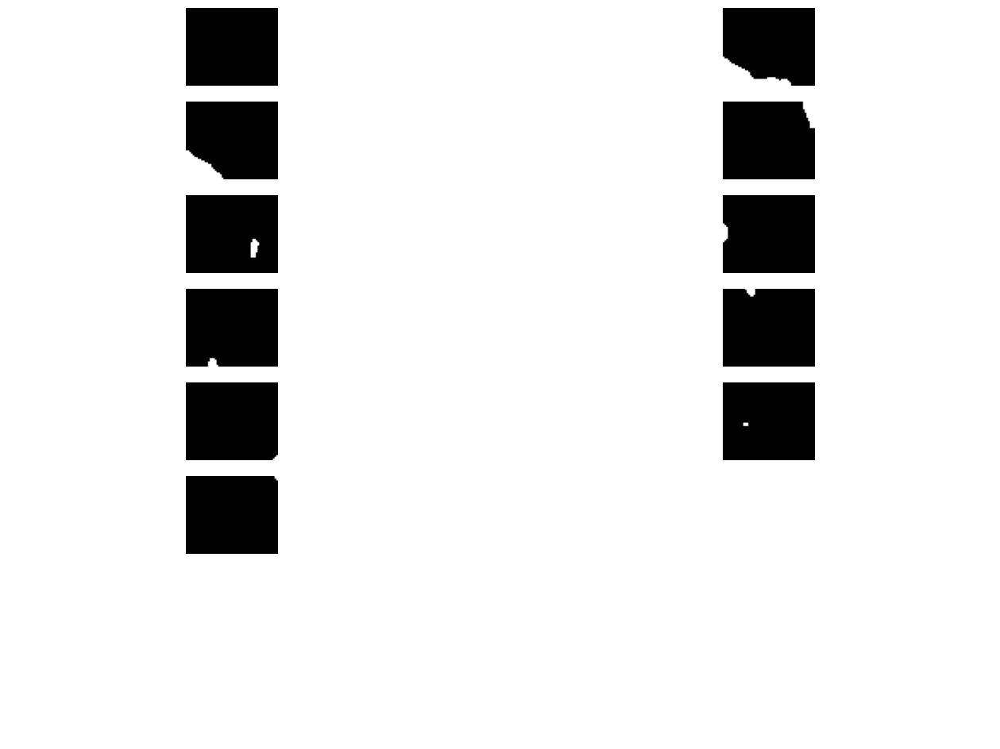

In [10]:
sample_masks = [
    mask['segmentation']
    for mask
    in sorted(sample_sam_result, key=lambda x: x['area'], reverse=True)
]

sv.plot_images_grid(
    images=sample_masks,
    grid_size=(8, int(len(sample_masks) / 8) + 1),
    size=(16, 12)
)

Execute the code block below to define the actual mask predictor using SAM.

In [11]:
import cv2
import numpy as np
import supervision as sv

mask_predictor = SamPredictor(sam)

#### SAM with Bounding Boxes
A classic type of prompt during SAM is bounding boxes. The model attempts to find the most likely masks in the box on the image. It ranks them once again based on area and other similar factors. It can easily be mixed with other prompts such as the point. Here the bounding box is put around the entire image.

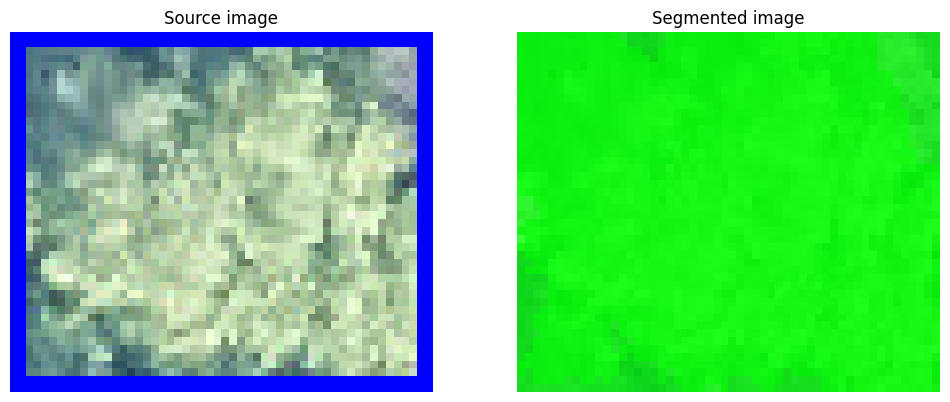

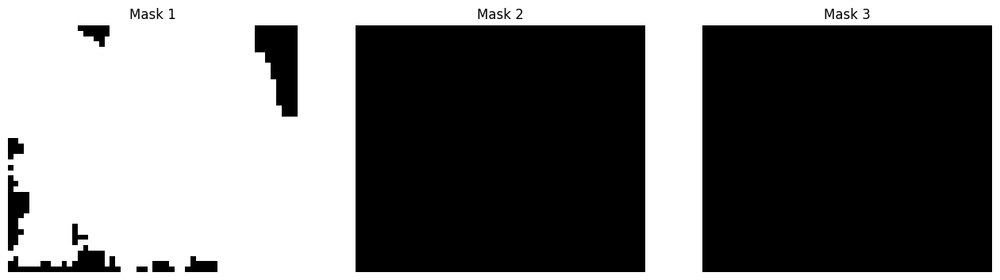

In [12]:
mask_predictor.set_image(sample_image_rgb)

box = np.array([0, 0, len(sample_image_rgb[0]), len(sample_image_rgb[1])])

masks, scores, logits = mask_predictor.predict(
    box=box,
    multimask_output=True
)

box_annotator = sv.BoxAnnotator(color=sv.Color.blue())
mask_annotator = sv.MaskAnnotator(color=sv.Color.green(), color_map='index')

detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)
source_image = box_annotator.annotate(scene=sample_image_bgr.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=sample_image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['Source image', 'Segmented image']
)


sv.plot_images_grid(
    images=masks,
    grid_size=(1, 3),
    size=(16, 16),
    titles = ['Mask 1', 'Mask 2', 'Mask 3']
)

#### SAM With Points
Another type of prompts during SAM is points. The points are treated as specifying a target area for the masks the user is asking for. However, as putting a plain point on an image is ambigious (e.g. a point on a shirt being for the shirt or the person wearing it), it once again outputs a list of masks that can be processed later.

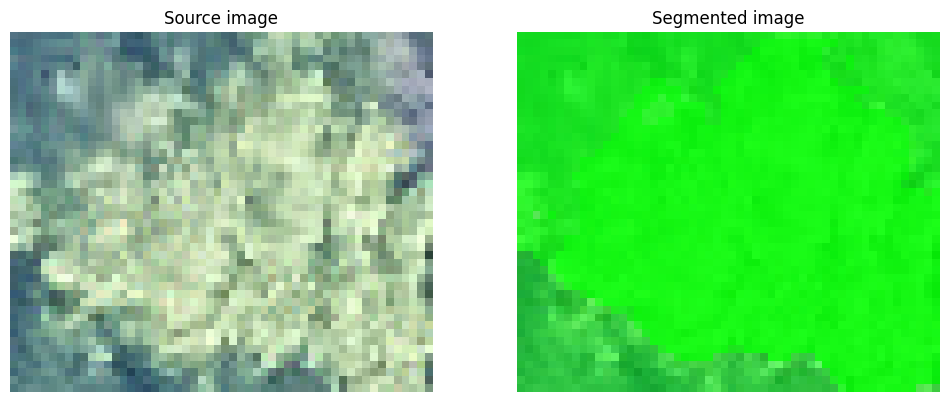

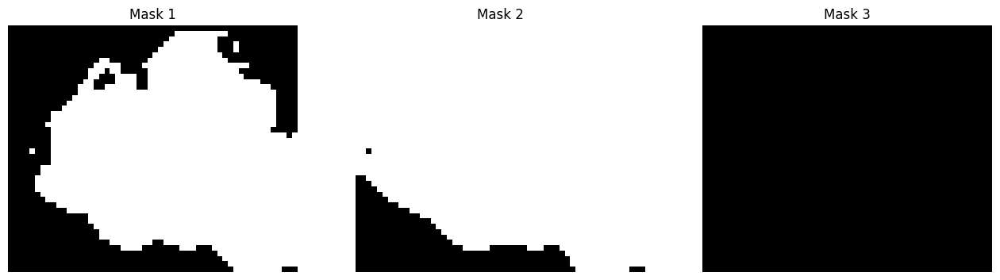

In [13]:
middle_point = np.array([[sample_image_bgr.shape[1] // 2, sample_image_bgr.shape[0] // 2]])
box_annotator = sv.BoxAnnotator(color=sv.Color.blue())
mask_annotator = sv.MaskAnnotator(color=sv.Color.green() , color_map='index')

masks, scores, logits = mask_predictor.predict(
    point_coords= middle_point,
    point_labels = np.array([1]),
    multimask_output=True
)

detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)

segmented_image = mask_annotator.annotate(scene=sample_image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[sample_image_bgr, segmented_image],
    grid_size=(1, 2),
    titles=['Source image', 'Segmented image']
)


sv.plot_images_grid(
    images=masks,
    grid_size=(1, 3),
    size=(16, 16),
    titles = ['Mask 1', 'Mask 2', 'Mask 3']
)

In [28]:
def histogram_equalization(img, equalization_type = 'vanilla', debug=False):
    img_before_equalization = img

    if debug:
      show_histogram(img_before_equalization)

    channels = cv2.split(img)
    equalized_channels = []


    if equalization_type == 'hsv':
        img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        img_before_equalization = img
        h, s, v = cv2.split(img)
        v = cv2.equalizeHist(v)
        equalized_channels = [h, s, v]


    for c in channels:
        if equalization_type == 'clahe':
            clahe = cv2.createCLAHE(clipLimit=5)
            eq_c = clahe.apply(c)
            equalized_channels.append(eq_c)
        elif equalization_type == 'hsv':
            continue
        else:
            eq_c = cv2.equalizeHist(c)
            equalized_channels.append(eq_c)

    equalized_img = cv2.merge(equalized_channels)
    if debug:
      show_histogram(equalized_img)

    return equalized_img


## Applying SAM on Vegetation Orthophotos.
This section will take the considerations from above and create an overall pipeline meant to delineate the crowns of the images passed to it. It should include a variety of approaches and the justfications for each one.

In [39]:
%cd {HOME}

box_annotator = sv.BoxAnnotator(color=sv.Color.blue())
mask_annotator = sv.MaskAnnotator(color=sv.Color.green() , color_map='index')

mask_predictor = SamPredictor(sam)


def predict(preprocessing=None, dataset_path=IMAGE_FOLDER_PATH, debug=False):
  predictions = []

  for img_name in [f for f in os.listdir(dataset_path) if '.png' in f]:
    img_path = os.path.join(dataset_path, img_name)

    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr.copy(), cv2.COLOR_BGR2RGB)

    prediction = []
    prediction.append(img_rgb)

    if preprocessing == 'hsv':
      img_rgb = cv2.cvtColor(img_bgr.copy(), cv2.COLOR_RGB2HSV)
    elif preprocessing == 'histogram_equalization_hsv':
      img_rgb = histogram_equalization(img_rgb.copy(), equalization_type = 'hsv')
    elif preprocessing == 'histogram_equalization_vanilla':
      img_rgb = histogram_equalization(img_rgb.copy(), equalization_type = 'vanilla')
    elif preprocessing == 'histogram_equalization_clahe':
      img_rgb = histogram_equalization(img_rgb.copy(), equalization_type = 'clahe')

    # img_rgb = histogram_equalization(img_rgb, equalization_type = 'hsv')
    ground_truth = cv2.imread(os.path.join(dataset_path, 'ground-truth', img_name.split('.png')[0] + '-GROUND_TRUTH.png'), cv2.IMREAD_GRAYSCALE)

    scale_factor = 3
    height, width = img_rgb.shape[:2]
    new_height, new_width = int(height * scale_factor), int(width * scale_factor)

    # Use interpolation method (cv2.INTER_CUBIC or cv2.INTER_LINEAR) for resizing
    img_rgb = cv2.resize(img_rgb, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
    img_rgb = cv2.medianBlur(img_rgb, 5)


    box = np.array([0, 0, img_rgb.shape[1], img_rgb.shape[0]])
    input_point = np.array([[img_rgb.shape[1] // 2, img_rgb.shape[0] // 2]])

    mask_predictor.set_image(img_rgb)

    masks, scores, logits = mask_predictor.predict(
        box=box,
        point_coords=input_point,
        point_labels = np.array([1]),
        multimask_output=True
    )

    masks_f = []
    for mask in masks:
      m = cv2.medianBlur(mask.astype(np.uint8), 5)

      if debug:
        plt.title('Mask')
        plt.imshow(mask)
        plt.show()
        plt.title('Median Blur Mask')
        plt.imshow(m)
        plt.show()

      masks_f.append(m.astype(bool))

    detections = sv.Detections(
      xyxy=sv.mask_to_xyxy(masks=masks),
      mask=np.array(masks_f),
      confidence = scores
    )
    detections = detections[0]
    downsized_mask = cv2.resize( np.squeeze(detections.mask.astype('uint8')), (height, width), interpolation=cv2.INTER_CUBIC)

    if debug:
      plt.title('Non-Downsized Mask')
      plt.imshow(np.squeeze(detections.mask.astype('uint8')))
      plt.show()
      plt.title('Downsized Mask')
      plt.imshow(downsized_mask)
      plt.show()

    prediction.append(downsized_mask)
    prediction.append(ground_truth)
    predictions.append(prediction)

    source_image = box_annotator.annotate(scene=img_rgb.copy(), detections=detections, skip_label=True)
    segmented_image = mask_annotator.annotate(scene=img_rgb.copy(), detections=detections)

    if debug:
      sv.plot_images_grid(
          images=[source_image, segmented_image],
          grid_size=(1, 2),
          titles=['source image', 'segmented image']
      )

      sv.plot_images_grid(
        images=np.array(masks_f),
        grid_size=(1, 3),
        size=(16, 5)
      )

      sv.plot_images_grid(
        images=detections.mask,
        grid_size=(1, 3),
        size=(16, 5)
      )
  return predictions

/content


## Area and Centroid Calculation

In [29]:
import matplotlib.pyplot as plt

def calculate_area_and_centroid(mask, resolution):

  total_labels, label_ids, values, centroids = cv2.connectedComponentsWithStats(mask, mask.copy(), 8)

  areas = np.argsort(values[:, cv2.CC_STAT_AREA])
  largest_component_index = areas[-1]
  max_area = np.multiply(np.square(resolution), values[largest_component_index, cv2.CC_STAT_AREA])
  max_area = np.divide(max_area, 10000)
  centroid = centroids[largest_component_index]

  largest_component_image = np.uint8(label_ids == largest_component_index)

  print('Area: {} m^2; Centroid: {} '.format(max_area, centroid))

  return max_area, centroid, largest_component_image

def visualize_centroid(original_img, mask, centroid):
  centroid_mask = tuple(map(int, centroid))
  centroid_norm = tuple(map(int, centroid))
  original = cv2.circle(original_img.copy(), centroid_norm, radius= 4, color=(0, 0, 255), thickness=-1)
  mask = cv2.circle(mask, centroid_mask, radius=4, color=(0, 0, 255), thickness=-1)

  fig, ax = plt.subplots(1, 2)
  ax[0].imshow(original)
  ax[1].imshow(mask)
  plt.show()

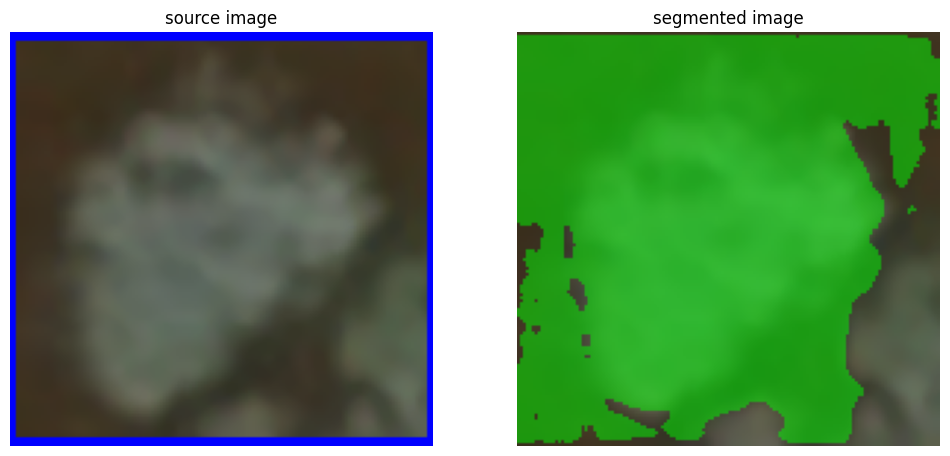

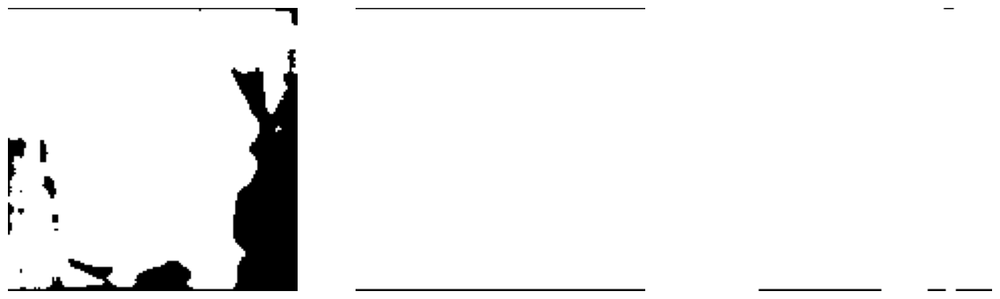

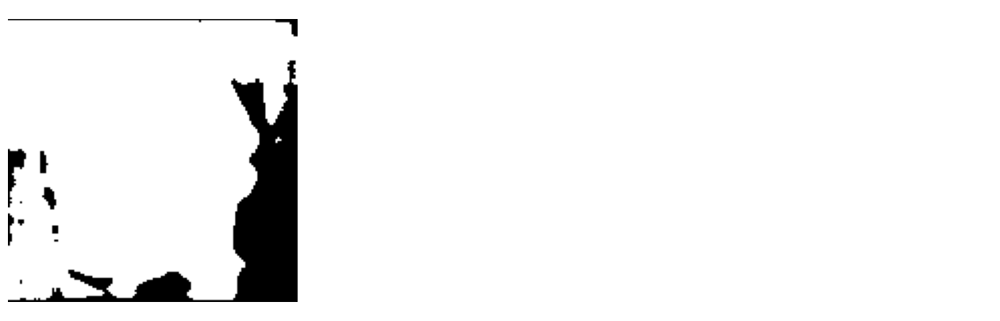

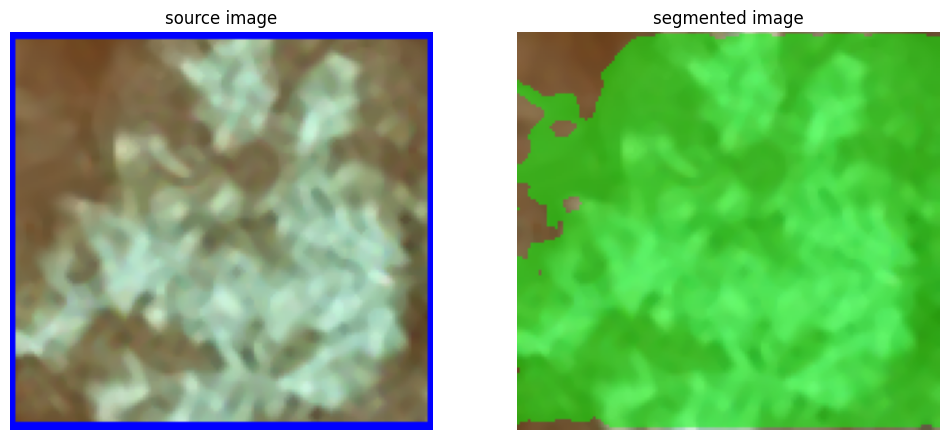

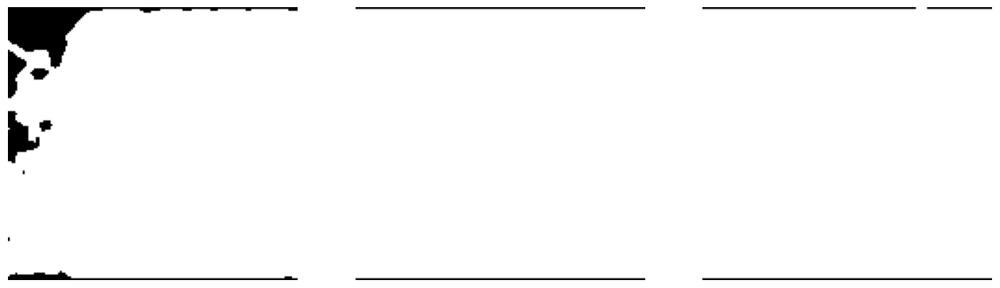

...

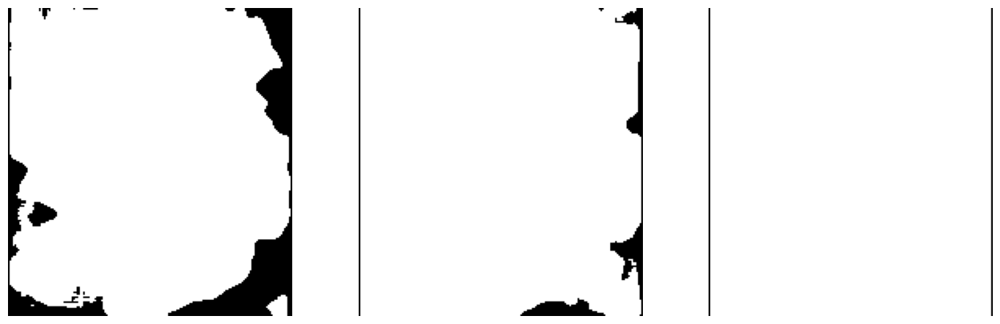

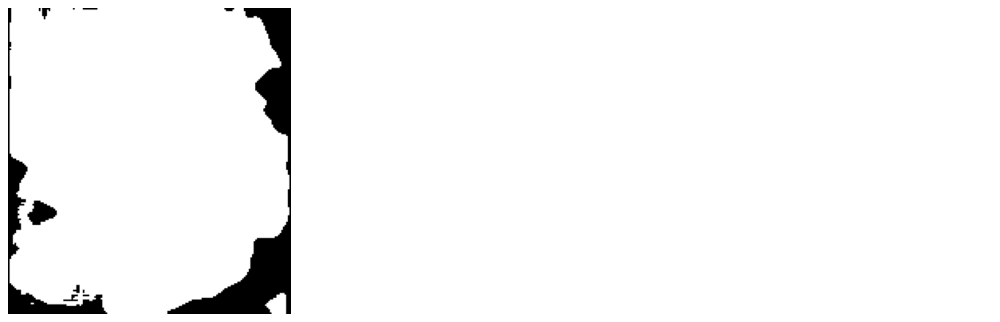

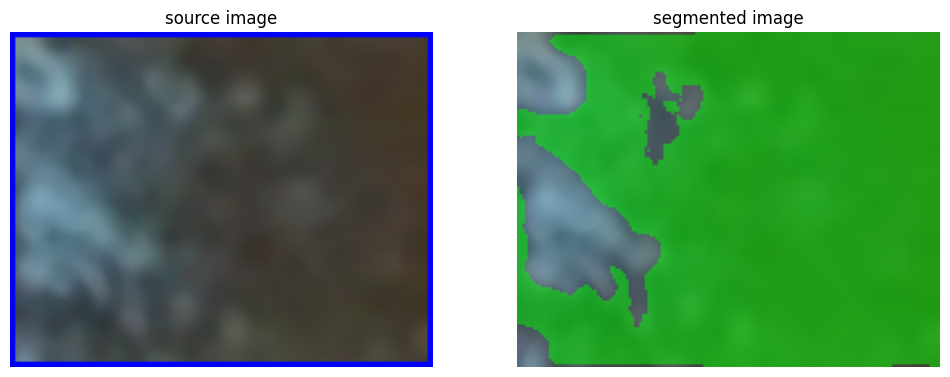

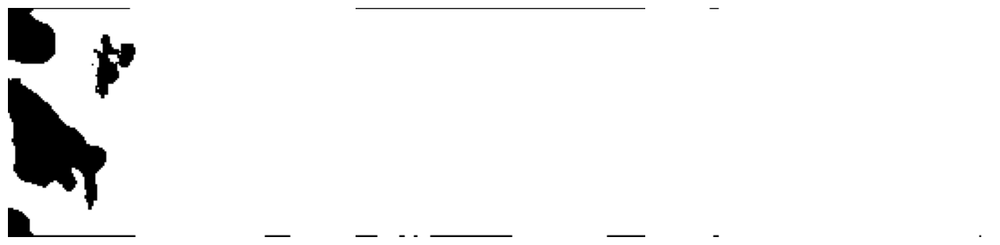

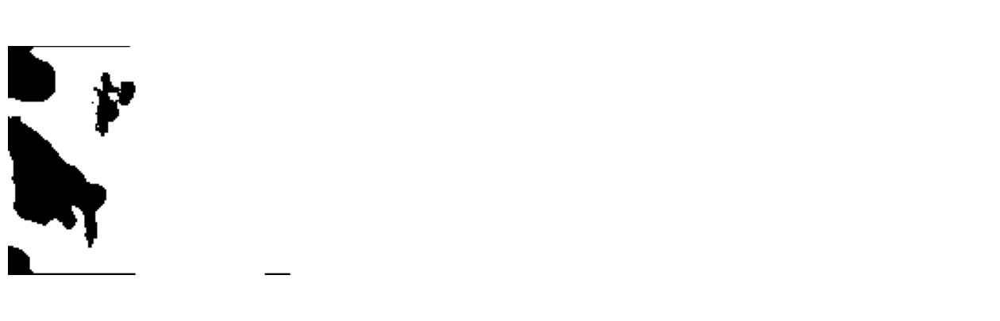

Area: 18.52 m^2; Centroid: [21.55993521 20.23866091] 


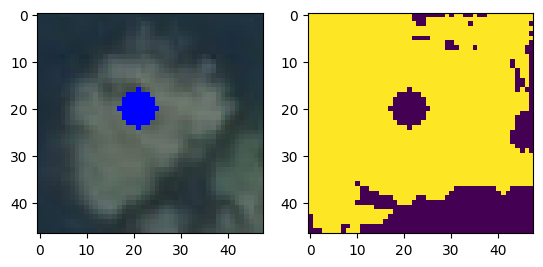

Area: 23.78 m^2; Centroid: [26.52396972 25.26408747] 


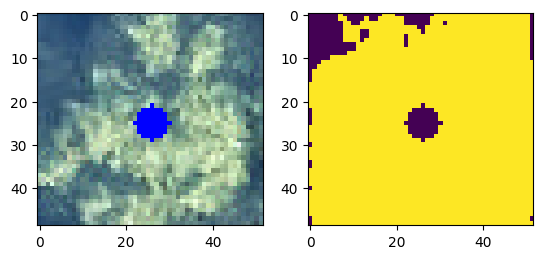

Area: 7.15 m^2; Centroid: [14.49090909 15.13146853] 


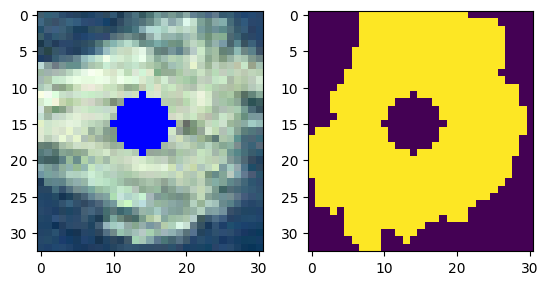

Area: 49.73 m^2; Centroid: [38.19987935 40.1109994 ] 


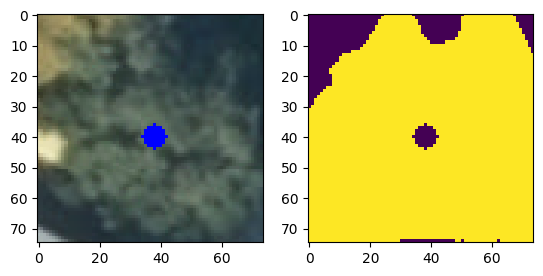

Area: 33.2 m^2; Centroid: [28.52620482 28.59337349] 


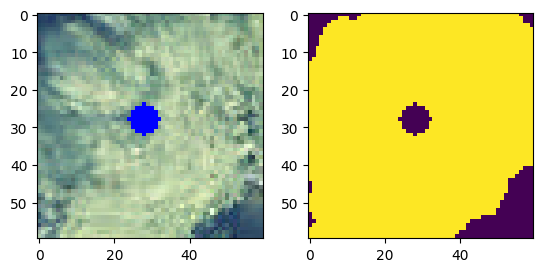

Area: 103.58 m^2; Centroid: [53.50791659 47.97856729] 


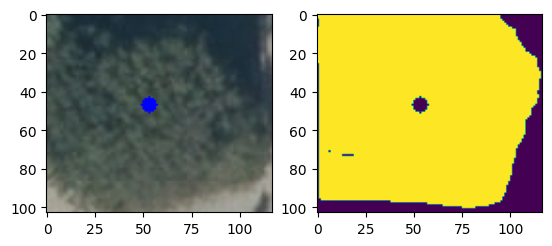

Area: 21.26 m^2; Centroid: [24.14440263 22.68344309] 


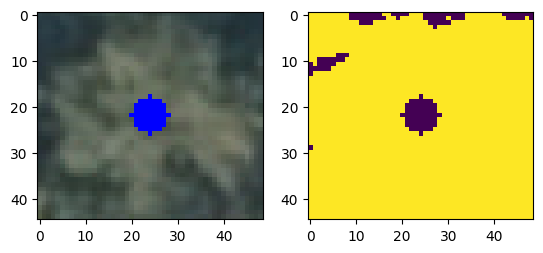

Area: 49.23 m^2; Centroid: [30.04631322 41.11598619] 


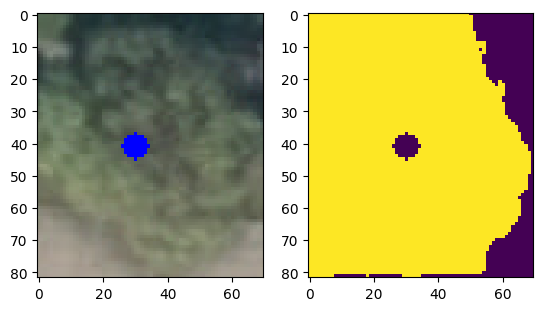

Area: 11.22 m^2; Centroid: [19.35650624 15.71479501] 


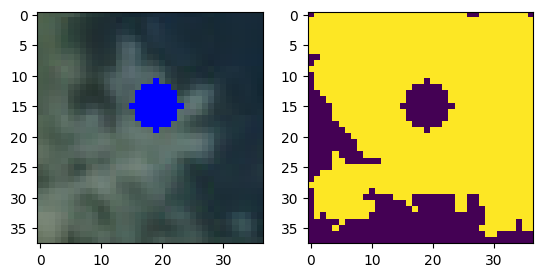

Area: 19.58 m^2; Centroid: [25.34627171 22.7854954 ] 


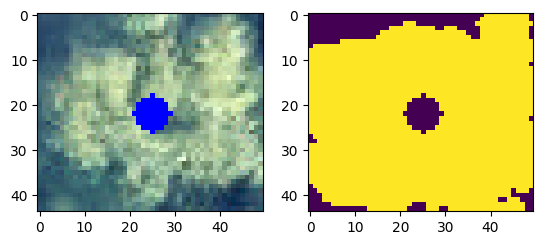

Area: 12.01 m^2; Centroid: [17.82431307 17.01831807] 


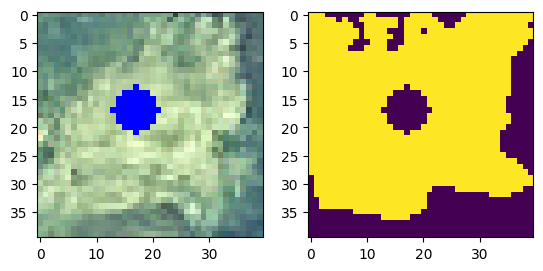

Area: 23.76 m^2; Centroid: [30.75925926 28.4280303 ] 


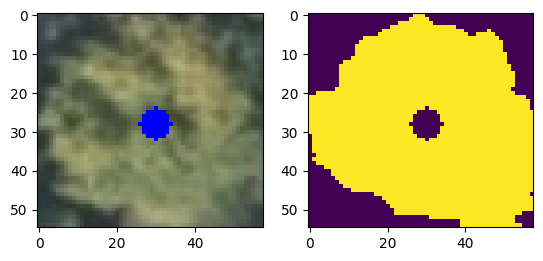

Area: 44.57 m^2; Centroid: [42.46466233 29.18398026] 


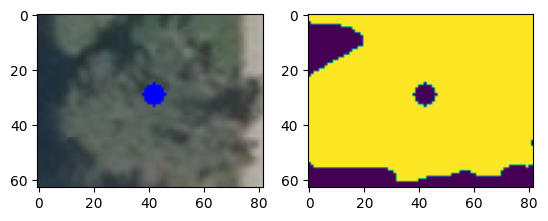

Area: 7.43 m^2; Centroid: [12.48183042 13.73351279] 


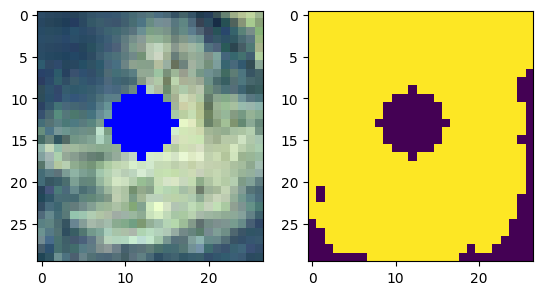

Area: 8.85 m^2; Centroid: [17.78870056 18.69717514] 


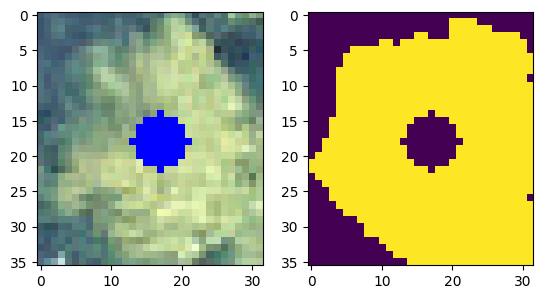

Area: 16.71 m^2; Centroid: [19.73309396 24.38240575] 


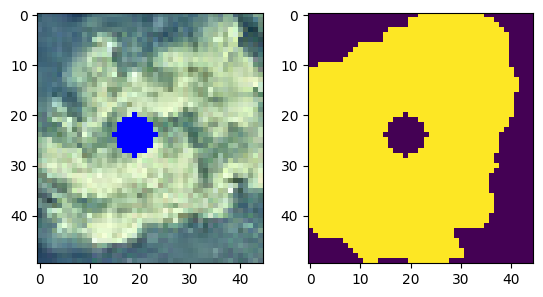

Area: 7.31 m^2; Centroid: [17.30916553 11.40766074] 


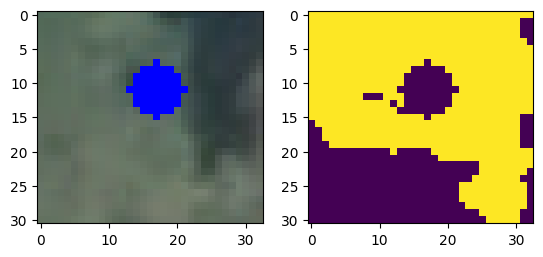

Area: 21.22 m^2; Centroid: [27.21771913 21.98256362] 


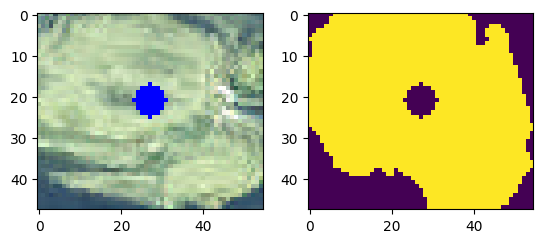

Area: 15.43 m^2; Centroid: [21.0272197  18.50421257] 


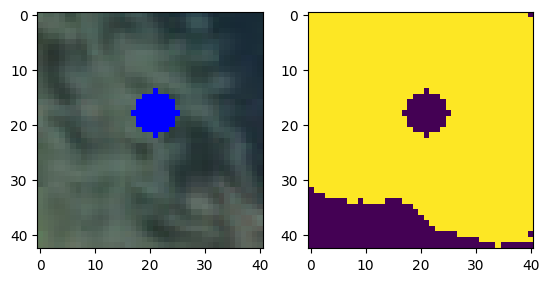

Area: 19.23 m^2; Centroid: [21.79407176 25.22568903] 


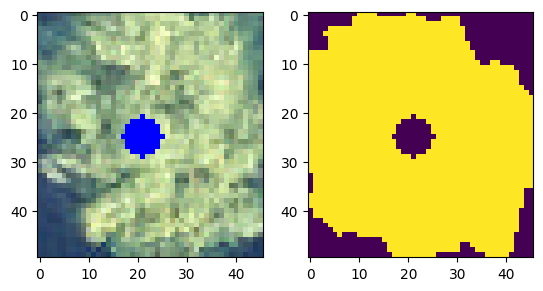

Area: 10.8 m^2; Centroid: [17.36759259 19.325     ] 


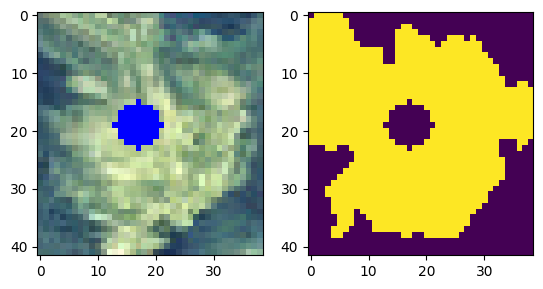

Area: 19.01 m^2; Centroid: [24.15465544 24.57390847] 


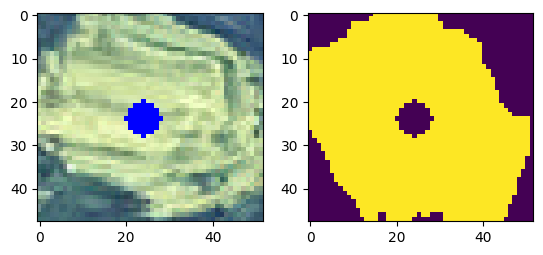

Area: 45.44 m^2; Centroid: [33.30193662 42.64722711] 


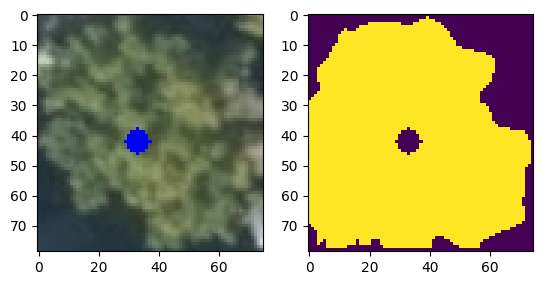

Area: 18.45 m^2; Centroid: [20.27100271 24.87317073] 


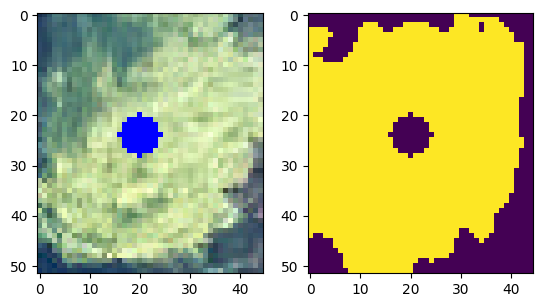

Area: 19.25 m^2; Centroid: [24.07844156 19.25246753] 


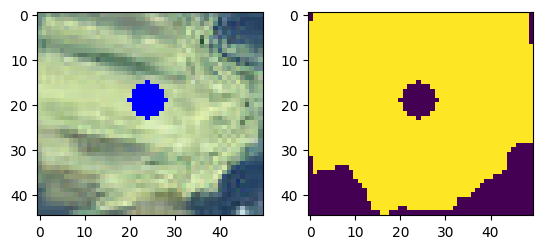

Area: 40.53 m^2; Centroid: [29.0592154  34.49050086] 


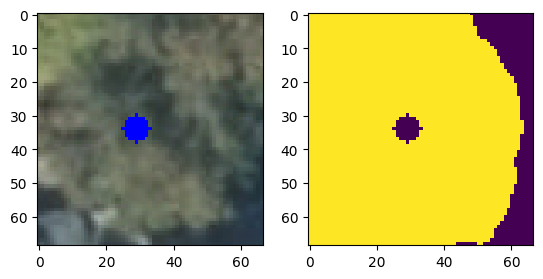

Area: 24.72 m^2; Centroid: [29.43487055 28.39279935] 


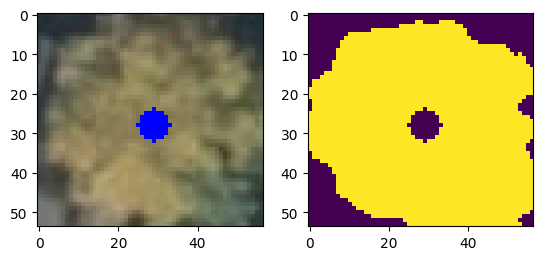

Area: 20.18 m^2; Centroid: [23.67294351 23.44152626] 


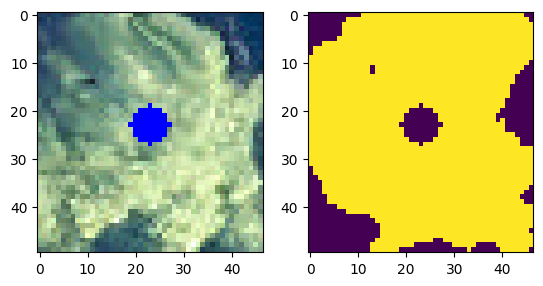

Area: 57.06 m^2; Centroid: [38.66859446 35.88363127] 


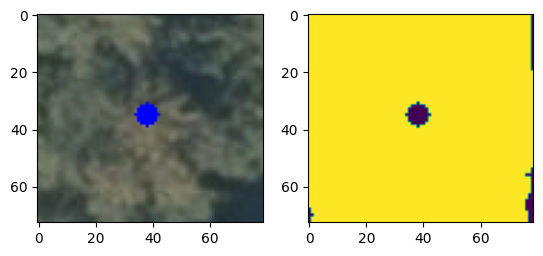

Area: 25.91 m^2; Centroid: [26.56194519 35.94982632] 


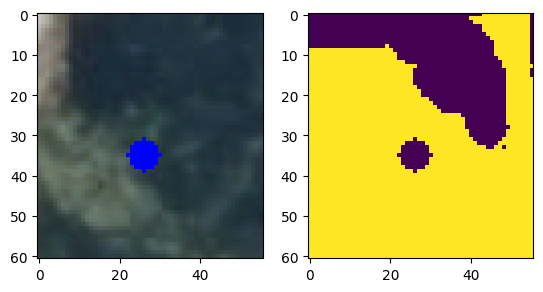

Area: 15.27 m^2; Centroid: [18.31172233 23.63981663] 


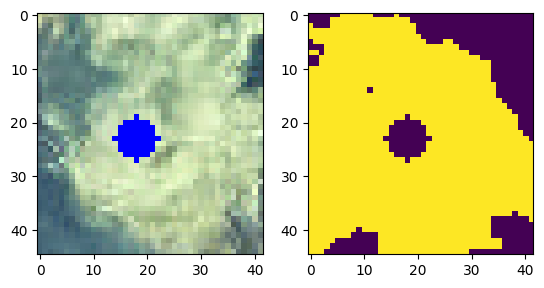

Area: 124.36 m^2; Centroid: [57.88854937 61.17955934] 


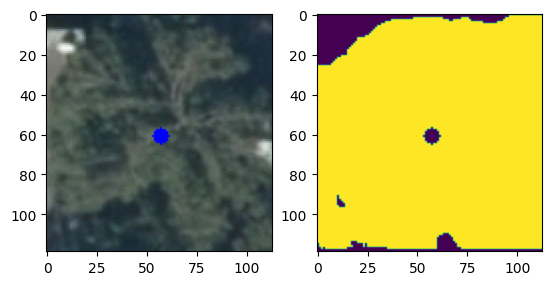

Area: 16.97 m^2; Centroid: [23.58397171 24.66529169] 


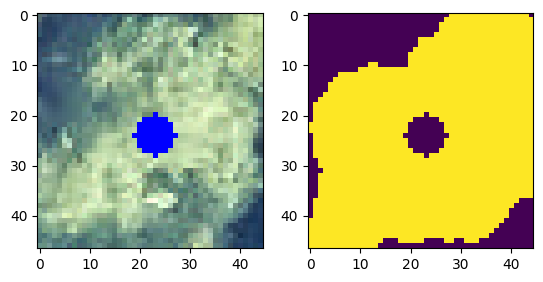

Area: 22.38 m^2; Centroid: [27.30875782 22.65683646] 


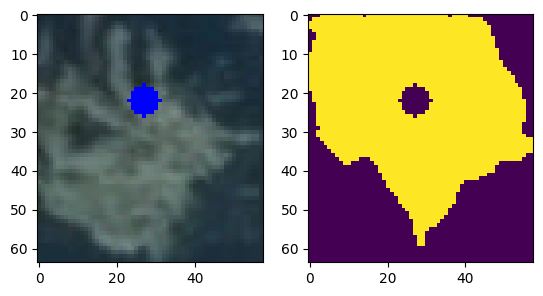

Area: 20.09 m^2; Centroid: [24.28322549 23.73967148] 


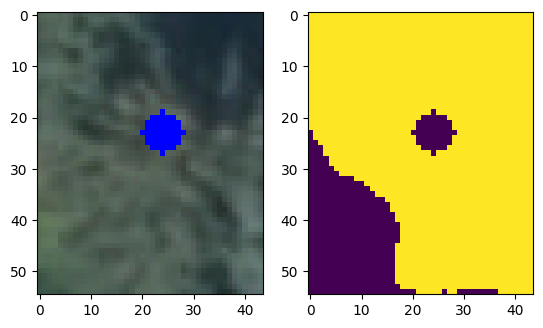

Area: 7.16 m^2; Centroid: [19.7849162  10.20949721] 


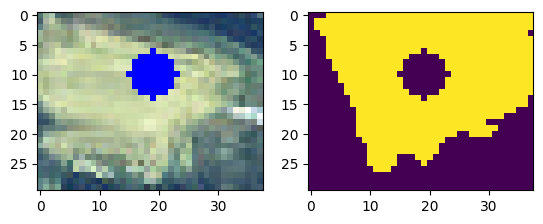

Area: 70.98 m^2; Centroid: [56.9436461  41.83319245] 


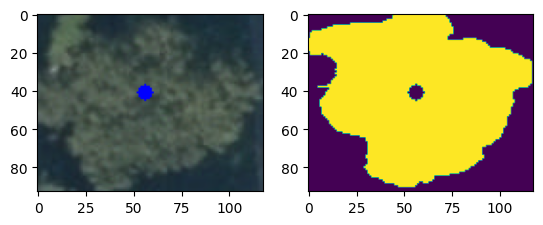

Area: 23.78 m^2; Centroid: [27.26366695 21.59714045] 


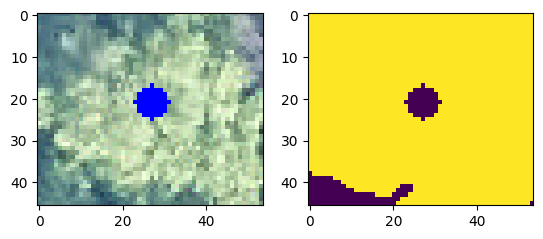

Area: 31.58 m^2; Centroid: [27.03768208 29.35275491] 


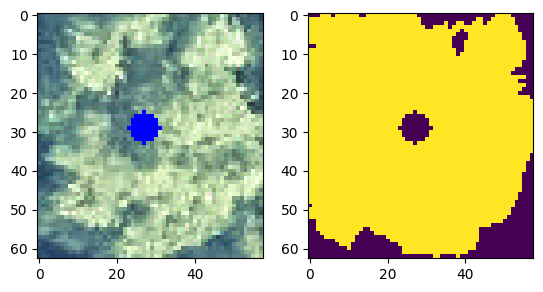

Area: 18.7 m^2; Centroid: [26.26363636 23.28128342] 


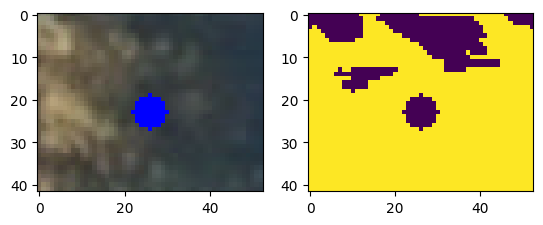

In [17]:
for original_img, mask, _ in predict():
  mask = mask.T
  area, centroid, largest_component_mask =  calculate_area_and_centroid(mask, 10) #as the NEON Dataset Photos are 0.1 m and I have scaled them up :))
  visualize_centroid(original_img, largest_component_mask, centroid)

## Evaluation
In this section we will be showing the results of all of the considerations during our pipeline, how we are going to measure it and the reasons for those results.

### Ground Truth Labeling

First we need to mention the labeling process as to what is ground truth.

For our purpose, every localized tree has an outline of their crown that can be represented as a binary mask. As such, I took all of the trees of our sample data, both from the NEON Open Dataset, as well  as the samples from Lozenetes and manually annotated them with a binary mask.

 The binary masks are rough and typically are overestimations. They are more so intented as a proof of concept rather than a concrete implementation to the trees from Sofia and the open dataset. They were annotated with the VGG platform (https://www.robots.ox.ac.uk/~vgg/software/via/via_demo.html).

 Here is how a binary mask looks:

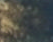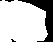 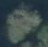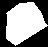

In [26]:
%cd {HOME}

GROUND_TRUTH_FOLDER_PATH = 'drive/MyDrive/Colab Notebooks/crown-delineation-data/neon-dataset/ground-truth'
print(GROUND_TRUTH_FOLDER_PATH, "; exist:", os.path.isdir(GROUND_TRUTH_FOLDER_PATH))

/content
drive/MyDrive/Colab Notebooks/crown-delineation-data/neon-dataset/ground-truth ; exist: False


### IoU - Intersection over Union
The main metric used is IoU, which is a standard metric in object detection. Here the object we are trying to detect is the exact shape of the tree crown in the interest of measuring it. It is worth mentioning that IoU is not perfect for all situations, and this is one of them, as in a perfectly localized tree just assuming the entire image is the tree would yield passable IoU results. A weighted IoU function is a future consideration.



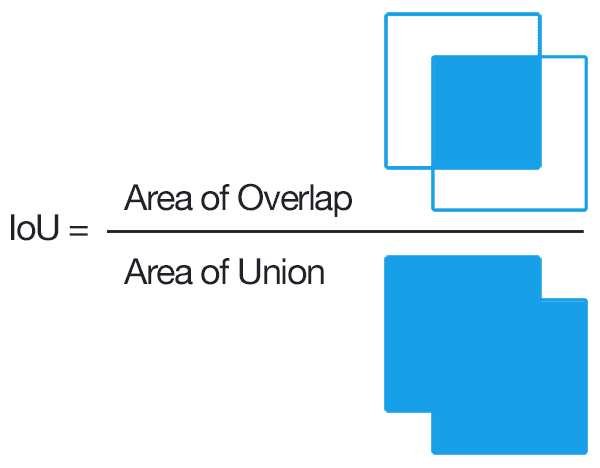


In [50]:
def intersection_over_union(original_img, prediction, ground_truth, visualize_masks=False):
    intersection = np.logical_and(prediction, ground_truth)
    union = np.logical_or(prediction, ground_truth)

    if visualize_masks:
      fig, ax = plt.subplots(1, 5)
      fig.set_figwidth(15)
      ax[0].imshow(original_img)
      ax[1].imshow(prediction)
      ax[2].imshow(ground_truth)
      ax[3].imshow(intersection)
      ax[4].imshow(union)
      ax[0].set_title('Original')
      ax[1].set_title('Prediction')
      ax[2].set_title('Ground Truth')
      ax[3].set_title('Intersection')
      ax[4].set_title('Union')
      plt.show()

    iou = np.sum(intersection) / np.sum(union)
    return iou

### Centroid Difference
As determining the centroid of the tree is a primary goal of the pipeline, it is worth mentioning how far off the predictions of the centers are. To compute the actual centroids, I have made use of the connected components functions. SAM's masking will not always yield one component and I have made it so that the largerst area component is always the one picked and the centroid is estimated for.

For the ground truth, it always has only one component, and its centroid is calculated in the same way.

The actual distance used is Euclidean Distance as we are talkng about real space.

In [19]:
def compute_centroid(mask):
  mask = cv2.convertScaleAbs(mask)
  _, _, values, centroids = cv2.connectedComponentsWithStats(mask, mask.copy(), 8)

  areas = np.argsort(values[:, cv2.CC_STAT_AREA])
  largest_component_index = areas[-1]
  centroid = centroids[largest_component_index]

  return centroid

def centroid_difference(centroid_1, centroid_2, image_resolution):
  return np.linalg.norm(centroid_1 - centroid_2) * image_resolution

In [20]:
def show_histogram(image_rgb):
  hist_r = cv2.calcHist([image_rgb], [0], None, [256], [0, 256])
  hist_g = cv2.calcHist([image_rgb], [1], None, [256], [0, 256])
  hist_b = cv2.calcHist([image_rgb], [2], None, [256], [0, 256])

  # Plot the histograms
  plt.figure(figsize=(8, 6))
  plt.title('Color Histogram')
  plt.xlabel('Pixel Value')
  plt.ylabel('Frequency')
  plt.xlim([0, 256])
  plt.stem(hist_r, linefmt='r-', markerfmt='ro', basefmt=' ', label='Red Channel')
  plt.stem(hist_g, linefmt='g-', markerfmt='go', basefmt=' ', label='Green Channel')
  plt.stem(hist_b, linefmt='b-', markerfmt='bo', basefmt=' ', label='Blue Channel')
  plt.legend()
  plt.show()

## Showing the performance

In [57]:
def evaluate(preprocessing=None, dataset_path=IMAGE_FOLDER_PATH, debug=False):
  iou_our = []
  centroid_distances_our = []
  for (original_img, prediction, ground_truth) in predict(preprocessing, dataset_path=dataset_path):
    prediction = prediction.T
    iou = intersection_over_union(original_img, prediction, ground_truth, debug)
    iou_our.append(iou)


    c1 = compute_centroid(ground_truth)
    c2 = compute_centroid(prediction)
    distance = centroid_difference(c1, c2, 10)
    centroid_distances_our.append(distance)

    if debug:
      print('IoU:', iou)
      print('Centroid Distance:', c1, c2, distance, ' cm')

  return np.mean(iou_our), np.mean(centroid_distances_our)

#### Baseline Circle Area Approximation and Bounding Box Centroid
For a baseline, we have defined an approach similar to the one given by Sofia-Plan.

For the area approximation, we simply place the circle as the area of the tree, centered at the calculated centroid.

In [55]:
def naive_baseline(dataset, debug=False):
  iou_naive = []
  centroid_distances_naive = []
  for (original_img, _, ground_truth) in predict(dataset_path=dataset):
    s = original_img.shape[:2]
    naive_prediction = cv2.circle(np.zeros(s), (s[0] // 2, s[1] // 2), min(s[0] // 2, s[1] // 2), (255, 255, 255), -1)
    iou = intersection_over_union(original_img, naive_prediction, ground_truth, debug)
    iou_naive.append(iou)
    c1 = compute_centroid(ground_truth)
    c2 = (s[1] / 2, s[0] / 2)
    distance = centroid_difference(c1, c2, 10)
    centroid_distances_naive.append(distance)
    if debug:
      print('Distance:', c1, c2, distance , ' cm')
      print('IoU:', iou)

  avg_iou_naive = np.mean(iou_naive)
  avg_dist_naive = np.mean(centroid_distances_naive)

  return avg_iou_naive, avg_dist_naive

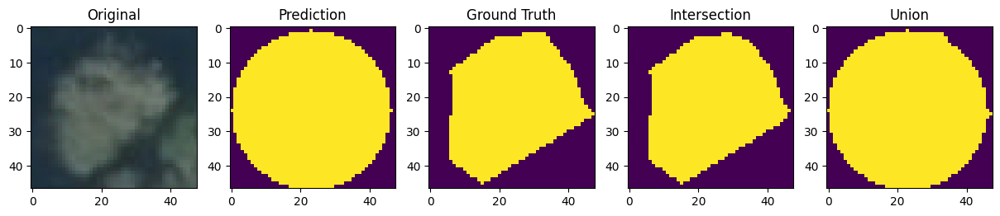

Distance: [23.40655738 22.10819672] (24.0, 23.5) 15.130401558791744  cm
IoU: 0.7290788681517159


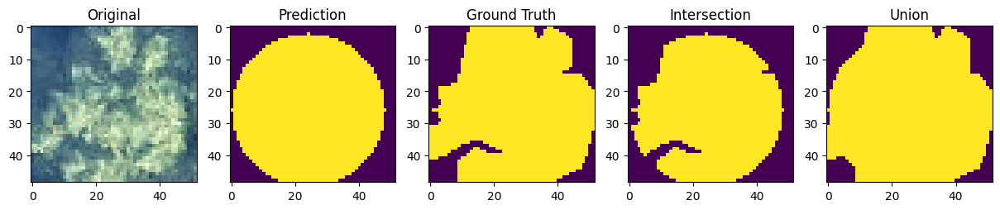

Distance: [26.80080281 25.18514802] (26.0, 24.5) 10.539036705954958  cm
IoU: 0.7767310409797457


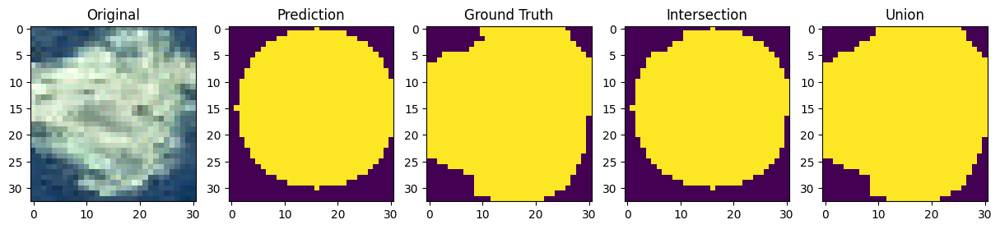

Distance: [15.47037915 15.57701422] (15.5, 16.5) 9.234609621927037  cm
IoU: 0.8173302107728337


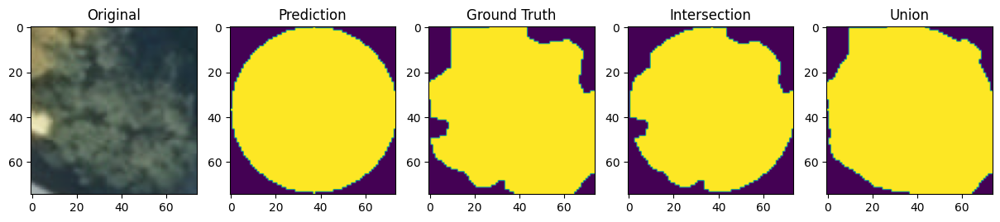

Distance: [37.99093722 37.9173298 ] (37.0, 37.5) 10.75230552239718  cm
IoU: 0.859915611814346


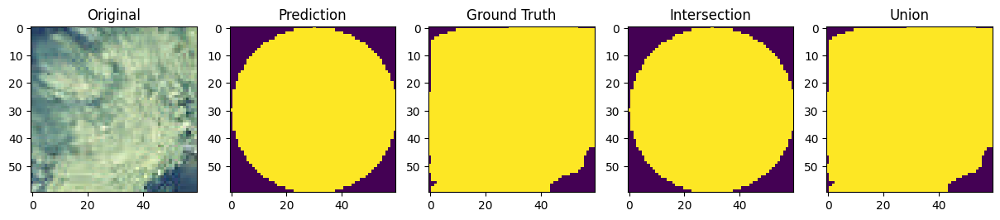

Distance: [29.09739491 29.01628182] (30.0, 30.0) 13.350645686032326  cm
IoU: 0.8339745486830423


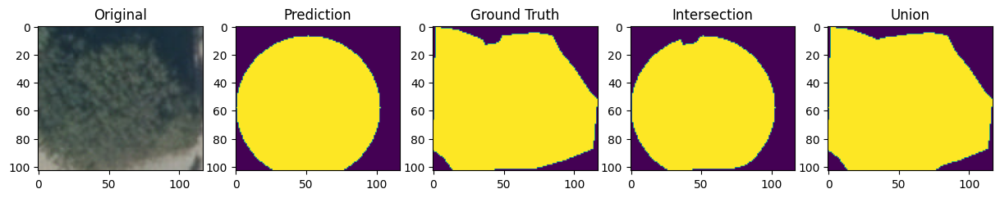

Distance: [53.1641322  54.64720195] (58.5, 51.5) 61.94866043221384  cm
IoU: 0.7893151235187789


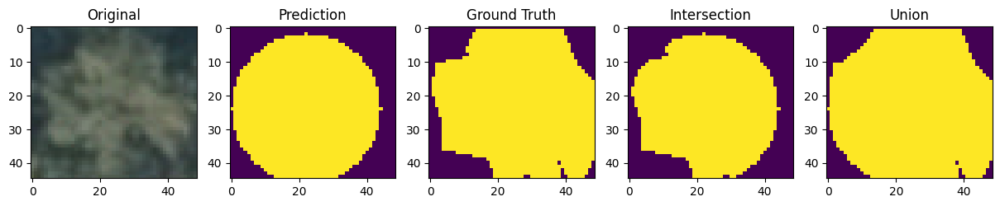

Distance: [26.08793103 22.7183908 ] (24.5, 22.5) 16.028785087480305  cm
IoU: 0.7539210383991347


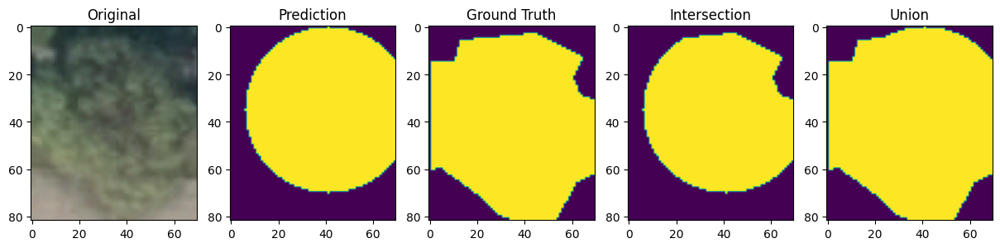

Distance: [35.15691187 40.92962879] (35.0, 41.0) 1.7196930299362618  cm
IoU: 0.7355282978265547


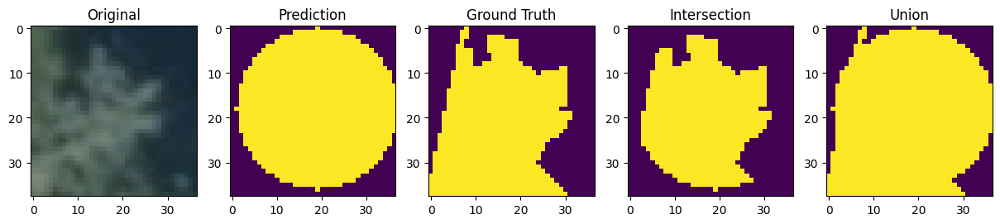

Distance: [15.0709988  21.69915764] (18.5, 19.0) 43.63886023467497  cm
IoU: 0.6033129904097646


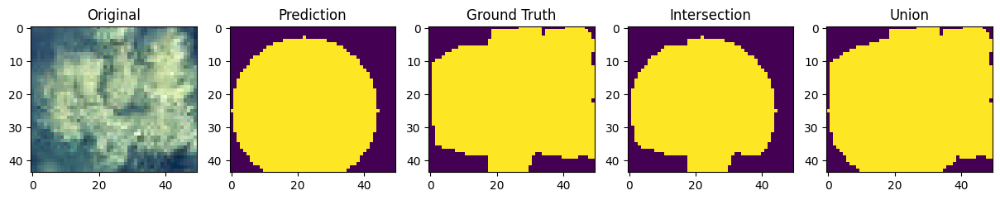

Distance: [26.31792873 20.96547884] (25.0, 22.0) 16.754611798924394  cm
IoU: 0.7097112860892388


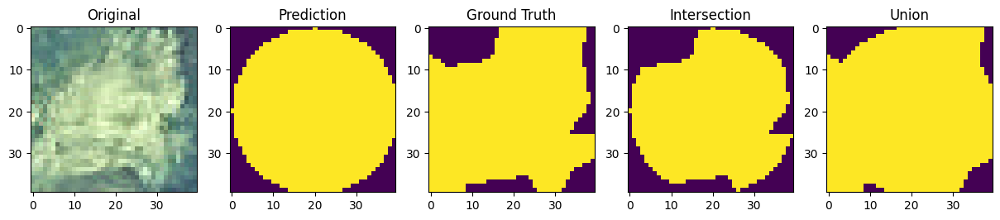

Distance: [19.34384615 20.27846154] (20.0, 20.0) 7.1279639324624195  cm
IoU: 0.7767732962447844


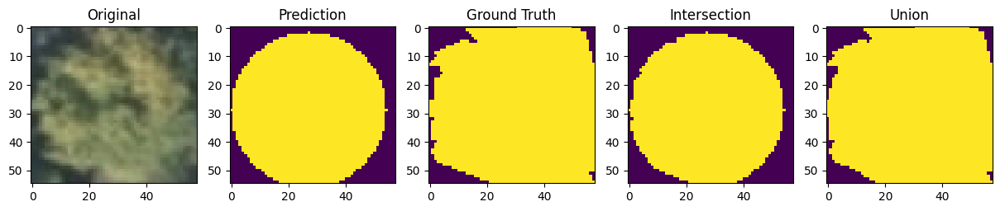

Distance: [30.31291333 27.50852767] (29.0, 27.5) 13.129410253058753  cm
IoU: 0.7787763567231247


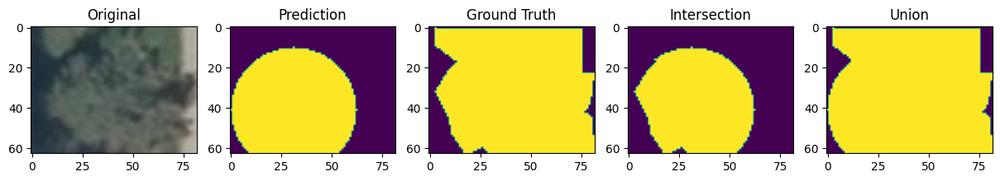

Distance: [43.22247602 31.25331201] (41.0, 31.5) 22.361249083646136  cm
IoU: 0.5256024096385542


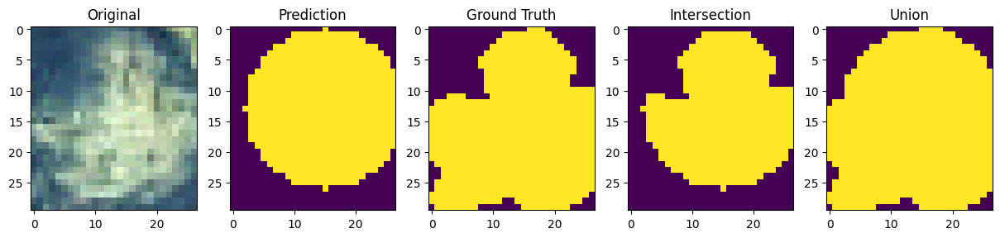

Distance: [13.80837359 16.64412238] (13.5, 15.0) 16.72791882670476  cm
IoU: 0.6588921282798834


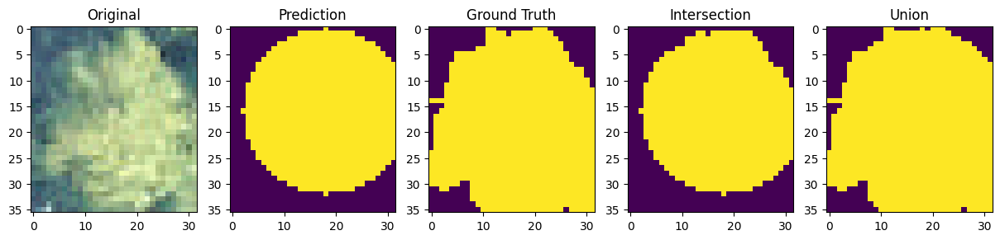

Distance: [16.55084746 18.94279661] (16.0, 18.0) 10.919241593267103  cm
IoU: 0.7633744855967078


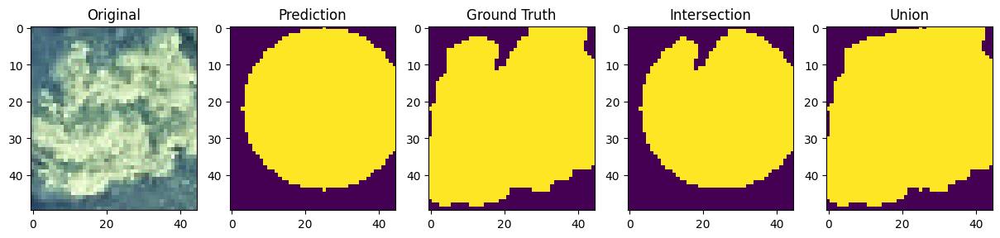

Distance: [22.18116343 24.27700831] (22.5, 25.0) 7.9017323334278045  cm
IoU: 0.7644849785407726


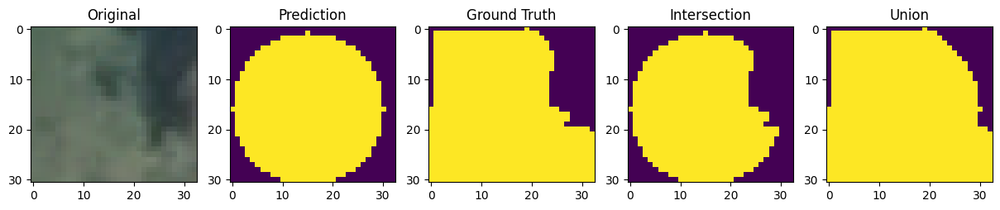

Distance: [13.93031785 16.80440098] (16.5, 15.5) 28.81792544856573  cm
IoU: 0.7340909090909091


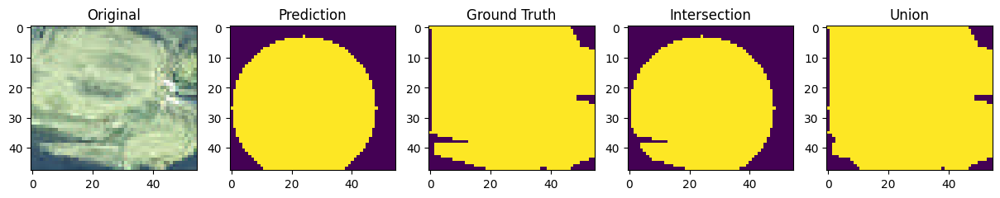

Distance: [27.34375    23.02919408] (27.5, 24.0) 9.832996485562504  cm
IoU: 0.6905920519059205


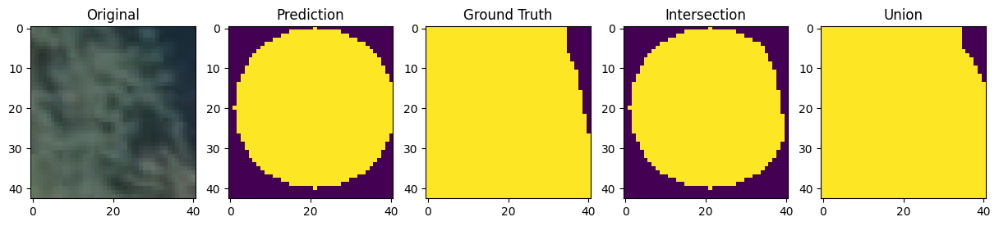

Distance: [18.99341712 21.66906044] (20.5, 21.5) 15.160387268158448  cm
IoU: 0.7157092614302462


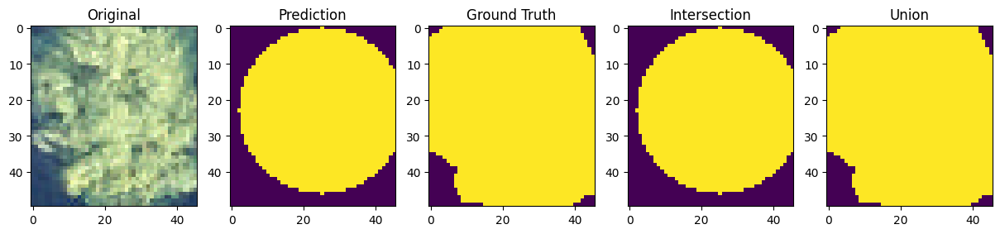

Distance: [23.21777571 23.68590042] (23.0, 25.0) 13.320225107021928  cm
IoU: 0.7538389948813402


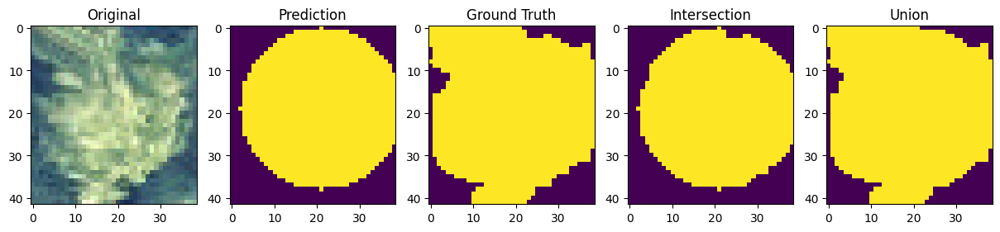

Distance: [18.79346211 19.17830609] (19.5, 21.0) 19.539100501451465  cm
IoU: 0.802930402930403


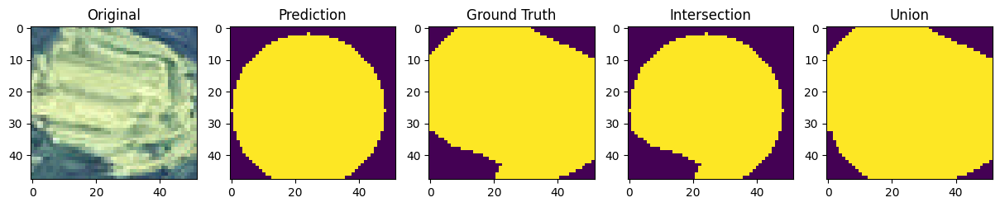

Distance: [26.33205742 22.82488038] (26.0, 24.0) 12.211339985788987  cm
IoU: 0.7389340560072267


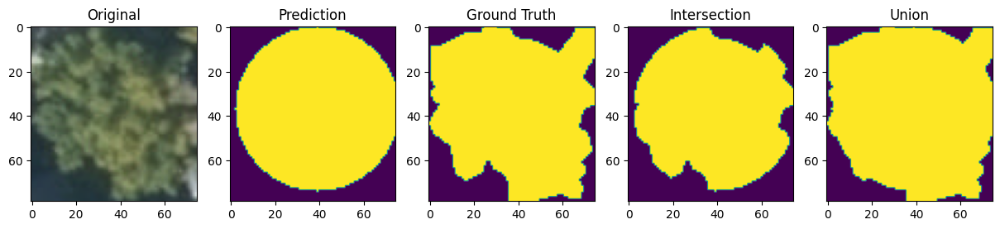

Distance: [38.71508863 37.15607436] (37.5, 39.5) 26.40156770453626  cm
IoU: 0.7920273807127038


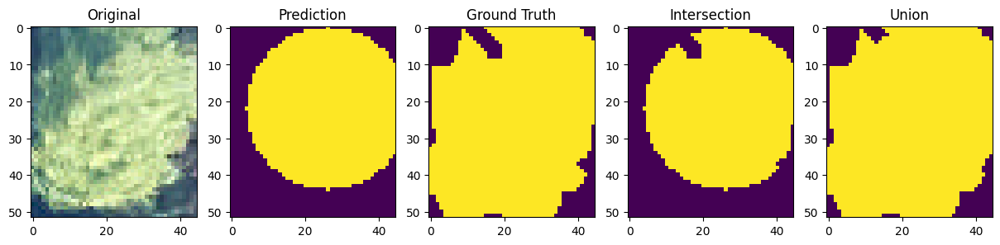

Distance: [22.2992126  25.81200787] (22.5, 26.0) 2.7505748501584226  cm
IoU: 0.6833734939759036


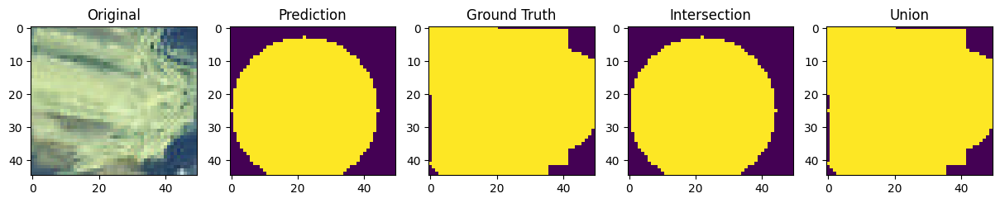

Distance: [23.04668305 21.82309582] (25.0, 22.5) 20.672799483441395  cm
IoU: 0.7283889980353635


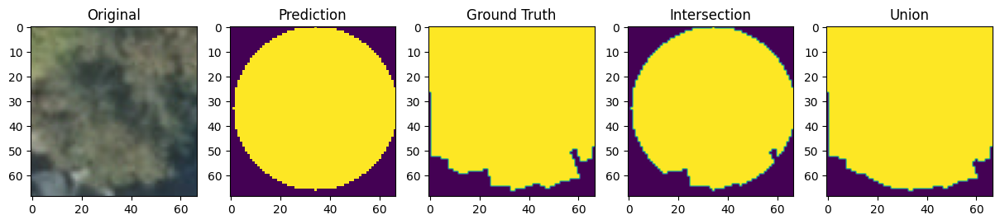

Distance: [33.55304908 29.94224095] (33.5, 34.5) 45.58067764485621  cm
IoU: 0.8164510617525018


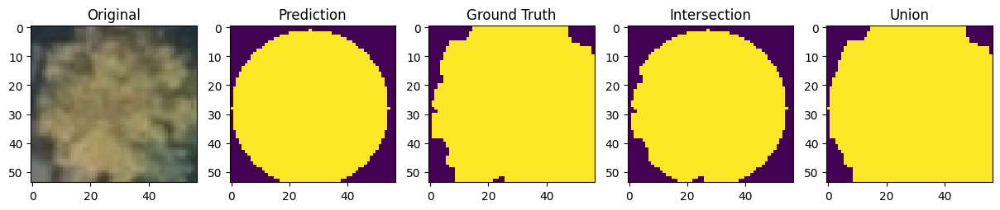

Distance: [30.03153649 27.21342134] (28.5, 27.0) 15.463352418656275  cm
IoU: 0.8076644974692697


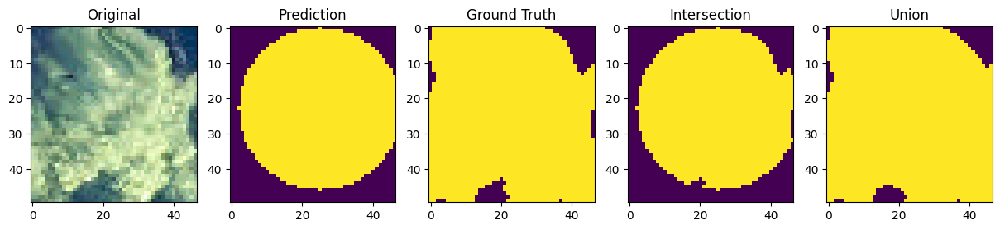

Distance: [22.33118971 25.00918695] (23.5, 25.0) 11.688463939779227  cm
IoU: 0.7259158751696065


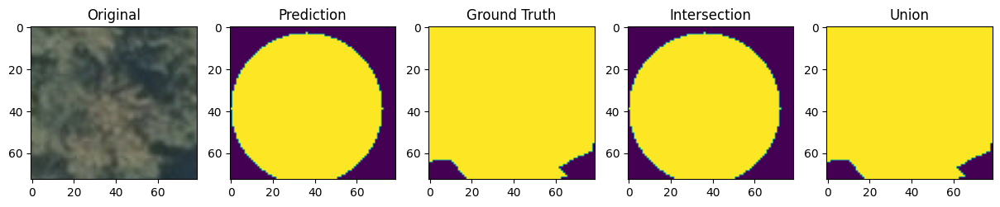

Distance: [38.78167214 34.33534137] (39.5, 36.5) 22.807327581401033  cm
IoU: 0.7323840817816721


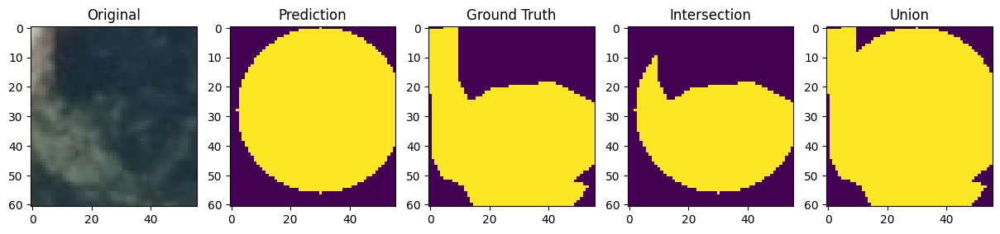

Distance: [26.24796011 36.66001813] (28.0, 30.5) 64.04331906722021  cm
IoU: 0.5432387312186978


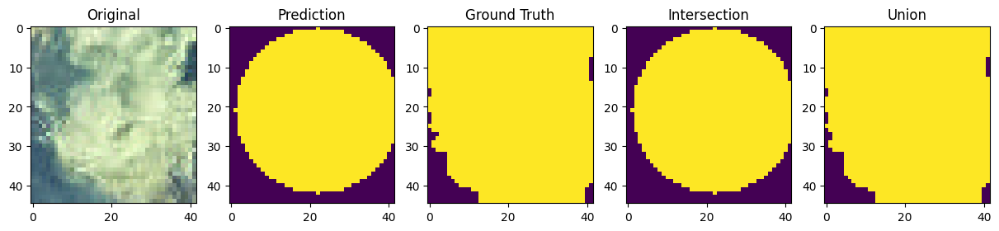

Distance: [21.44172825 20.90221717] (21.0, 22.5) 16.57719465567776  cm
IoU: 0.7705848949460534


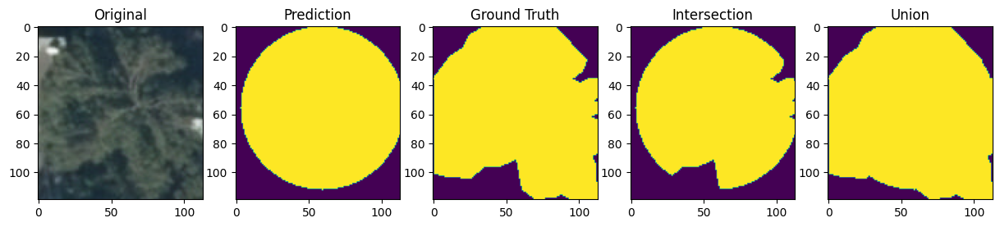

Distance: [58.36153916 58.52867694] (56.5, 59.5) 20.99713442885308  cm
IoU: 0.8112894782760426


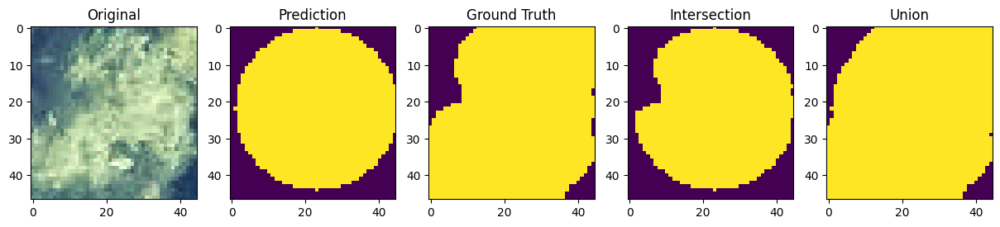

Distance: [23.37110634 23.82330827] (22.5, 23.5) 9.29168708428646  cm
IoU: 0.7457364341085271


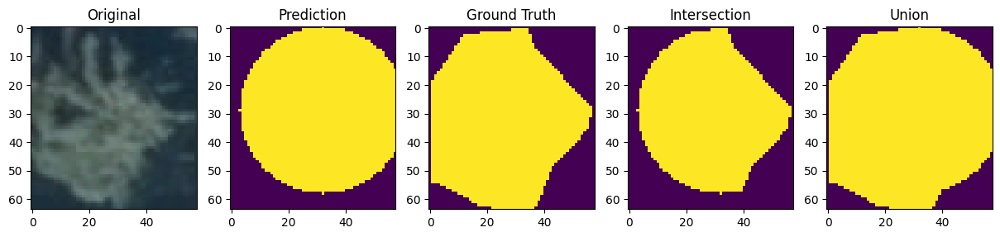

Distance: [25.03739399 32.48882035] (29.0, 32.0) 39.926422028974685  cm
IoU: 0.6988150098749177


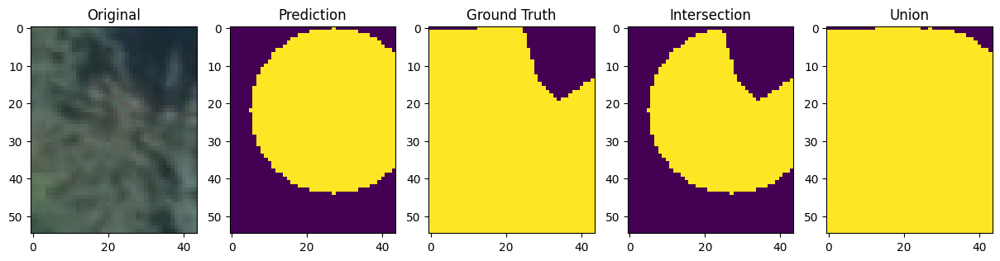

Distance: [19.79406221 29.75824694] (22.0, 27.5) 31.56871993152825  cm
IoU: 0.49682068673166596


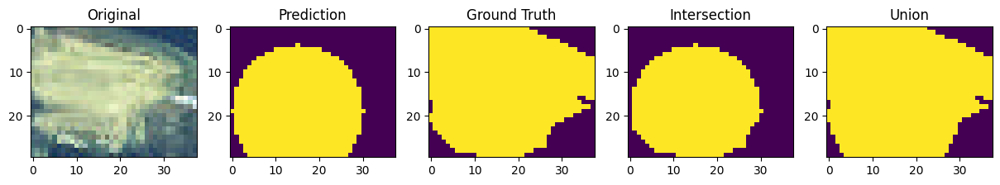

Distance: [16.59656652 13.60515021] (19.0, 15.0) 27.788663874514377  cm
IoU: 0.6260330578512396


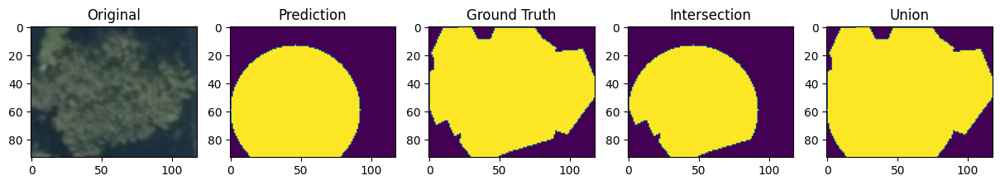

Distance: [55.2437246  43.90557016] (59.0, 46.5) 45.65158382012383  cm
IoU: 0.6121333779413405


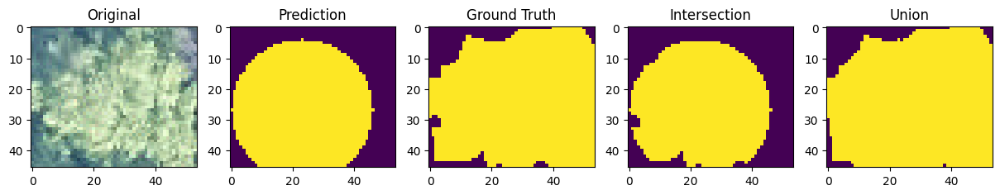

Distance: [28.79636533 23.83410997] (27.0, 23.0) 19.805726059226444  cm
IoU: 0.6884650317892824


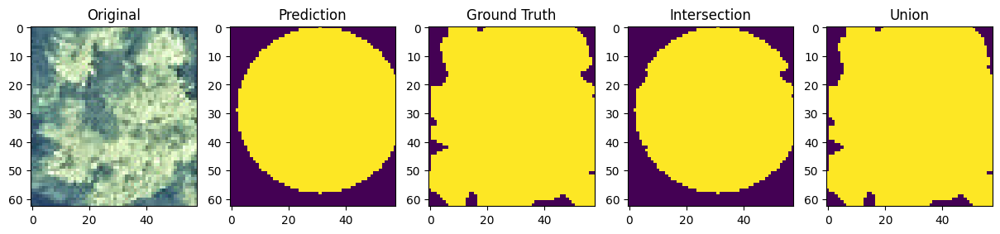

Distance: [29.45061543 31.42479736] (29.0, 31.5) 4.568475717540709  cm
IoU: 0.7633224173861268


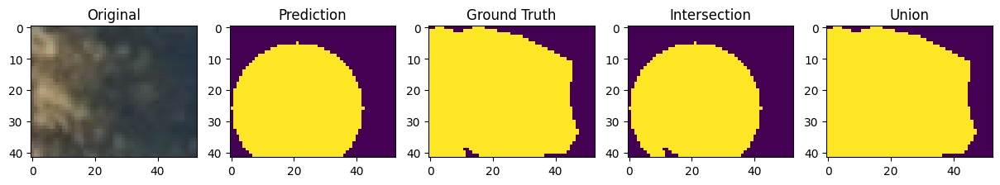

Distance: [21.38141391 21.91163056] (26.5, 21.0) 51.99133949561514  cm
IoU: 0.7156640181611805


(0.7267781718774281, 21.343053257095967)

In [56]:
naive_baseline(IMAGE_FOLDER_PATH, debug=True)

In [54]:
FULL_DATASET_PATH = IMAGE_FOLDER_PATH
BONA_DATASET_PATH='/content/crown-delineation-data/bona-data'
LOZENETS_DATASET_PATH='/content/crown-delineation-data/lozenets-data'

datasets = []
datasets.append(['BONA Dataset',  BONA_DATASET_PATH])
datasets.append(['Lozenets Dataset', LOZENETS_DATASET_PATH])
datasets.append(['Full Dataset', IMAGE_FOLDER_PATH])

In [53]:
def evaluate_datasets(datasets, debug=False):
    for dataset_name, dataset_path in datasets:
      print('================================================')
      print('Evaluation of {}'.format(dataset_name))
      avg_iou_naive, avg_dist_naive = naive_baseline(dataset_path)
      avg_iou_no_preprocessing, avg_dist_no_preprocessing = evaluate(preprocessing=None, dataset_path=dataset_path)
      avg_iou_hsv, avg_dist_hsv = evaluate(preprocessing='hsv', dataset_path=dataset_path)
      avg_iou_hist_eq, avg_dist_hist_eq = evaluate(preprocessing='histogram_equalization_vanilla', dataset_path=dataset_path)
      avg_iou_hist_hsv, avg_dist_hist_hsv = evaluate(preprocessing='histogram_equalization_hsv', dataset_path=dataset_path)
      avg_iou_hist_clahe, avg_dist_hist_clahe = evaluate(preprocessing='histogram_equalization_clahe', dataset_path=dataset_path)

      show_result('Naive Baseline', avg_iou_naive, avg_dist_naive)
      show_result('No Pre-Processing', avg_iou_no_preprocessing, avg_dist_no_preprocessing)
      show_result('HSV Pre-Processing', avg_iou_hsv, avg_dist_hsv)
      show_result('Histogram Pre-Processing', avg_iou_hist_eq, avg_dist_hist_eq)
      show_result('HSV Histogram Pre-Processing', avg_iou_hist_hsv, avg_dist_hist_hsv)
      show_result('CLAHE Pre-Processing', avg_iou_hist_clahe, avg_dist_hist_clahe)

In [59]:
def show_result(name, iou, distance):
  print(name, "- IoU:", iou, 'Distance:', distance)

In [58]:
evaluate_datasets(datasets)

Evaluation of BONA Dataset
Naive Baseline - IoU: 0.7409693842087002 Distance: 13.030150412157525
No Pre-Processing - IoU: 0.8132003914814929 Distance: 22.3342123919594
HSV Pre-Processing - IoU: 0.7754573237627163 Distance: 20.48321603081684
Histogram Pre-Processing - IoU: 0.8076880942527923 Distance: 23.941393046633078
HSV Histogram Pre-Processing - IoU: 0.6980930396151769 Distance: 25.3119046879069
CLAHE Pre-Processing - IoU: 0.8495857503688045 Distance: 14.198387656127414
Evaluation of Lozenets Dataset
Naive Baseline - IoU: 0.7125869595461563 Distance: 29.655956102034416
No Pre-Processing - IoU: 0.7514863347672283 Distance: 42.54033715753849
HSV Pre-Processing - IoU: 0.6926643296257889 Distance: 59.54134654218939
Histogram Pre-Processing - IoU: 0.7008204174655668 Distance: 56.16177938512912
HSV Histogram Pre-Processing - IoU: 0.652663768510384 Distance: 57.03887678738221
CLAHE Pre-Processing - IoU: 0.7782841319973393 Distance: 38.70132277361435
Evaluation of Full Dataset
Naive Baseli

```
================================================
Evaluation of BONA Dataset
Naive Baseline - IoU: 0.7409693842087002 Distance: 13.030150412157525
No Pre-Processing - IoU: 0.8132003914814929 Distance: 22.3342123919594
HSV Pre-Processing - IoU: 0.7754573237627163 Distance: 20.48321603081684
Histogram Pre-Processing - IoU: 0.8076880942527923 Distance: 23.941393046633078
HSV Histogram Pre-Processing - IoU: 0.6980930396151769 Distance: 25.3119046879069
CLAHE Pre-Processing - IoU: 0.8495857503688045 Distance: 14.198387656127414
================================================
Evaluation of Lozenets Dataset
Naive Baseline - IoU: 0.7125869595461563 Distance: 29.655956102034416
No Pre-Processing - IoU: 0.7514863347672283 Distance: 42.54033715753849
HSV Pre-Processing - IoU: 0.6926643296257889 Distance: 59.54134654218939
Histogram Pre-Processing - IoU: 0.7008204174655668 Distance: 56.16177938512912
HSV Histogram Pre-Processing - IoU: 0.652663768510384 Distance: 57.03887678738221
CLAHE Pre-Processing - IoU: 0.7782841319973393 Distance: 38.70132277361435
================================================
Evaluation of Full Dataset
Naive Baseline - IoU: 0.7267781718774281 Distance: 21.343053257095967
No Pre-Processing - IoU: 0.7823433631243606 Distance: 32.437274774748936
HSV Pre-Processing - IoU: 0.7340608266942527 Distance: 40.01228128650312
Histogram Pre-Processing - IoU: 0.7542542558591796 Distance: 40.0515862158811
HSV Histogram Pre-Processing - IoU: 0.6753784040627803 Distance: 41.175390737644555
CLAHE Pre-Processing - IoU: 0.813934941183072 Distance: 26.449855214870887
```

## Results Discussion and Conclusions



The results of the recognition pipeline are mixed. Judiging purely on IoU and distance, the default pipeline and the majority of the strategies in both IoU and distance. On visual examination, however, this is seemingly as the circle is large enough to cover a majority of the tree along with the centroid. The actual ground truth/mask overlap is often absurd, which can create a lot of problems once localization is not "perfect" as in the labeled data. Same goes for the centroid of the given tree. This can give further trouble if trying to down the line classify the type of tree in the city as well make any judgements on its shape (perhaps for building a 3-D model). As such, I believe IoU is not a good metric for this type of masking. The tree always takes up a majority of the image, and having a high intersection guarantees a high result. As such, taking another metric would be worthwhile.

On visual examiantion, SAM's masking seems to perform well on a majority of cases. The upscaling and downscaling clears a majority of the noise created by the masking and typically at least roughly follows the outline of the tree. Some outliers, however, have little to no correlation with the reality of the tree om the image. However, those cases are typically challenging even for human expert annotation.

Out of all of the pre-processing pipelines, either no image enhancement or CLAHE seem to give the best results, both centroid and image wise. CLAHE, as a less aggressive histogram equalization technique does not distort any parts of the outline of the tree, which is why it also likely has the highest IoU. Visual examination confirms this, despite the fact that it also often overestimates in the case of Lozenets.

The other preprocessing techniques seem to distort at least some part of the image and give less accurate results.


Future improvements are more annotated data, both from forests and the city of Lozenets, which is going to take time, as well as a cross-validation pipeline to pick the best parameters for image upscaling, median filtering. More post-processing techniques for the myriad of masks SAM should also be considered.





## References
- https://docs.opencv.org/3.4/d3/dc0/group__imgproc__shape.html#gaedef8c7340499ca391d459122e51bef5
- https://data.neonscience.org/data-products/DP3.30010.001
- https://www.robots.ox.ac.uk/~vgg/software/via/via_demo.html
- https://github.com/facebookresearch
- https://roboflow.github.io/supervision/